# Data_exploration

## Modules Importation

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import plotly.graph_objects as go

## Datasets (orders and customers) Describing 

In [2]:
orders = [pd.read_csv(f'data/raw_data/orders/orders_export_{i}.csv', low_memory=False) for i in range(1, 10)]
df_orders = pd.concat(orders, ignore_index=True)
df_orders.describe(include='all')

,Name,Email,Financial Status,Paid at,Fulfillment Status,Fulfilled at,Accepts Marketing,Currency,Subtotal,Shipping,...,Tax 5 Value,Phone,Receipt Number,Duties,Billing Province Name,Shipping Province Name,Payment ID,Payment Terms Name,Next Payment Due At,Payment References
count,191466,188503,113411,109373,113411,112624,113411,113411,113411.000000,113411.000000,...,1538.000000,5.486000e+03,0.0,0.0,7597,7572,112588,3,0.0,112588
unique,113411,82619,6,109336,4,109121,2,2,NaN,NaN,...,NaN,NaN,NaN,NaN,174,163,112588,3,NaN,112588
top,5377,logistique@lytess.com,paid,2022-06-01 09:31:29 +0200,fulfilled,2020-12-14 08:57:14 +0100,no,EUR,NaN,NaN,...,NaN,NaN,NaN,NaN,Rome,Rome,rshNUu7h9WFmHtOuWGNanjjHc,Due on fulfillment,NaN,rshNUu7h9WFmHtOuWGNanjjHc
freq,38,2621,108009,3,112624,20,85492,113409,NaN,NaN,...,NaN,NaN,NaN,NaN,742,743,1,1,NaN,1
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.428076,2.745605,...,5.718472,8.062260e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.696749,3.029899,...,6.663314,2.052199e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,...,0.410000,6.875151e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.940000,0.000000,...,2.660000,3.362419e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.920000,0.000000,...,3.990000,3.366551e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.900000,5.830000,...,6.640000,3.369844e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# display all columns
pd.set_option('display.max_columns', None) 
df_customers = pd.read_csv('data/raw_data/customers_export.csv')

df_customers.describe(include='all')


,Customer ID,First Name,Last Name,Email,Accepts Email Marketing,Default Address Company,Default Address Address1,Default Address Address2,Default Address City,Default Address Province Code,Default Address Country Code,Default Address Zip,Default Address Phone,Phone,Accepts SMS Marketing,Total Spent,Total Orders,Note,Tax Exempt,Tags
count,78922,74107,74035,76135,78922,4182,71739,15490,71740,7069,72792,71727,71594,26707,78922,78922.000000,78922.000000,770,78922,8794
unique,78922,17799,51546,76135,2,3373,69281,13081,32606,157,31,9497,70080,26707,2,NaN,NaN,756,2,2750
top,'3220287651979,Nathalie,Nathalie,lailaembarek@yahoo.fr,no,Madame,"Sovereign SNS, 4 Rue de la Presse (par la rue ...",1,Paris,RM,FR,75015,'+33 4 83 53 08 88,'+33611233582,no,NaN,NaN,flits_referral_code: 1jCqZ7125442,no,#wgfr#wg
freq,1,811,140,1,55275,121,32,63,1762,652,62635,260,38,1,76309,NaN,NaN,5,78918,3485
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.144868,1.156129,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,226.580644,4.232468,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.940000,1.000000,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.430000,1.000000,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.350000,1.000000,NaN,NaN,NaN


## Linking orders with customers

## adding customer_id column in df_orders (linking using e-mails)

In [4]:
# Filter the rows where the email in df_orders doesn't exist in df_customers
unmatched_orders = df_orders[~df_orders['Email'].isin(df_customers['Email'])]

# Get the number of unmatched rows
num_unmatched_orders = len(unmatched_orders)

# Output the result
print(f"Number of unmatched rows in df_orders: {num_unmatched_orders}")

Number of unmatched rows in df_orders: 40244


In [5]:
print(df_orders.shape)

(191466, 75)


In [7]:
customer_id_list = []
for email in df_orders['Email']:
  try:
    # if email exists in df_customers retrieve the customer's id
    customer_id = df_customers[df_customers['Email'] == email]['Customer ID'].values[0]
  except IndexError:
    # if email not found in df_customers fill list with no
    customer_id = 'no'  # Adjust placeholder as needed
  customer_id_list.append(customer_id)

# Add the new column and fill its rows with the created (filled) list
df_orders['customer_id'] = customer_id_list

In [8]:
# checking new column
df_orders.describe(include='all')

,Name,Email,Financial Status,Paid at,Fulfillment Status,Fulfilled at,Accepts Marketing,Currency,Subtotal,Shipping,Taxes,Total,Discount Code,Discount Amount,Shipping Method,Created at,Lineitem quantity,Lineitem name,Lineitem price,Lineitem compare at price,Lineitem sku,Lineitem requires shipping,Lineitem taxable,Lineitem fulfillment status,Billing Name,Billing Street,Billing Address1,Billing Address2,Billing Company,Billing City,Billing Zip,Billing Province,Billing Country,Billing Phone,Shipping Name,Shipping Street,Shipping Address1,Shipping Address2,Shipping Company,Shipping City,Shipping Zip,Shipping Province,Shipping Country,Shipping Phone,Notes,Note Attributes,Cancelled at,Payment Method,Payment Reference,Refunded Amount,Vendor,Id,Tags,Risk Level,Source,Lineitem discount,Tax 1 Name,Tax 1 Value,Tax 2 Name,Tax 2 Value,Tax 3 Name,Tax 3 Value,Tax 4 Name,Tax 4 Value,Tax 5 Name,Tax 5 Value,Phone,Receipt Number,Duties,Billing Province Name,Shipping Province Name,Payment ID,Payment Terms Name,Next Payment Due At,Payment References,customer_id
count,191466,188503,113411,109373,113411,112624,113411,113411,113411.000000,113411.000000,113411.000000,113411.000000,17996,113411.000000,113374,191466,191466.000000,191466,191466.000000,69239.000000,191464,191466,191466,191466,113409,113279,113279,24735,8220,113403,113258,7429,113409,102621,113409,113279,113279,24516,11532,113403,113267,7404,113409,109762,71717,53331,752,44573,111944,113411.000000,92839,1.134110e+05,8691,113411,113411,191466.000000,104262,104262.000000,62110,62110.000000,16596,16596.000000,5105,5105.000000,1538,1538.000000,5.486000e+03,0.0,0.0,7597,7572,112588,3,0.0,112588,191466
unique,113411,82619,6,109336,4,109121,2,2,NaN,NaN,NaN,NaN,3046,NaN,32,113372,NaN,1772,NaN,NaN,740,2,2,3,87502,89448,87938,17390,3757,41068,9331,157,41,75759,87961,90276,88559,17783,6426,40615,9256,147,33,85091,11369,11375,751,30,111944,NaN,3,NaN,7095,3,12,NaN,101,NaN,126,NaN,98,NaN,77,NaN,60,NaN,NaN,NaN,NaN,174,163,112588,3,NaN,112588,58376
top,5377,logistique@lytess.com,paid,2022-06-01 09:31:29 +0200,fulfilled,2020-12-14 08:57:14 +0100,no,EUR,NaN,NaN,NaN,NaN,LYTESSNEWS,NaN,Colissimo livraison à domicile - sans signature,2020-12-05 21:30:11 +0100,NaN,Legging Minceur de Nuit Noir - Taille : S/M : ...,NaN,NaN,LOT200001A106/000-BLC-TU,True,True,fulfilled,Logistique Lytess,23 rue des Hautes Roches,23 rue des Hautes Roches,GBC,LYTESS,Paris,37230,RM,FR,Phone number: N/A,Logistique Lytess,23 rue des Hautes Roches,23 rue des Hautes Roches,batiment acticom,LYTESS,Paris,37230,RM,FR,0247738016,[BPR-371950]FR - POINT RETRAIT : BUREAU DE POS...,lang: fr\nInvoice Language: fr,2023-11-17 15:19:40 +0100,PayPal Express Checkout,rshNUu7h9WFmHtOuWGNanjjHc,NaN,Lytess,NaN,"Cdiscount - FR, Cdiscount Flux",Low,web,NaN,FR TVA 20%,NaN,Tax 20%,NaN,Tax 20%,NaN,Tax 20%,NaN,Tax 20.02%,NaN,NaN,NaN,NaN,Rome,Rome,rshNUu7h9WFmHtOuWGNanjjHc,Due on fulfillment,NaN,rshNUu7h9WFmHtOuWGNanjjHc,no
freq,38,2621,108009,3,112624,20,85492,113409,NaN,NaN,NaN,NaN,7731,NaN,35943,38,NaN,1991,NaN,NaN,4241,191464,186589,190114,895,1800,1801,63,1804,2655,2109,742,101941,2622,895,1795,1797,120,1800,2367,2108,743,102200,1475,57450,37324,2,14481,1,NaN,92817,NaN,215,113245,45017,NaN,39570,NaN,23421,NaN,4699,NaN,1276,NaN,249,NaN,NaN,NaN,NaN,742,743,1,1,NaN,1,43207
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.428076,2.745605,8.237894,53.016735,NaN,2.299204,NaN,NaN,1.259999,NaN,24.505284,44.540965,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.660672,NaN,3.838872e+12,NaN,NaN,NaN,0.050810,NaN,4.061341,NaN,5.790703,NaN,6.437455,NaN,6.350595,NaN,5.718472,8.062260e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.696749,3.029899,8.194064,49.070596,NaN,17.848257,NaN,NaN,2.125282,NaN,12.125364,12.021116,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.320970,NaN,9.390494e+11,NaN,NaN,NaN,0.926968,NaN,6

In [7]:
# create new DF for orders where customer_id="no" 
df_orders_no_email = df_orders[df_orders['customer_id'] == 'no'].copy()

# delete the rows where customer_id = "no" from df_orders
df_orders = df_orders.query('customer_id != "no"')
df_orders.describe(include='all')


,Name,Email,Financial Status,Paid at,Fulfillment Status,Fulfilled at,Accepts Marketing,Currency,Subtotal,Shipping,Taxes,Total,Discount Code,Discount Amount,Shipping Method,Created at,Lineitem quantity,Lineitem name,Lineitem price,Lineitem compare at price,Lineitem sku,Lineitem requires shipping,Lineitem taxable,Lineitem fulfillment status,Billing Name,Billing Street,Billing Address1,Billing Address2,Billing Company,Billing City,Billing Zip,Billing Province,Billing Country,Billing Phone,Shipping Name,Shipping Street,Shipping Address1,Shipping Address2,Shipping Company,Shipping City,Shipping Zip,Shipping Province,Shipping Country,Shipping Phone,Notes,Note Attributes,Cancelled at,Payment Method,Payment Reference,Refunded Amount,Vendor,Id,Tags,Risk Level,Source,Lineitem discount,Tax 1 Name,Tax 1 Value,Tax 2 Name,Tax 2 Value,Tax 3 Name,Tax 3 Value,Tax 4 Name,Tax 4 Value,Tax 5 Name,Tax 5 Value,Phone,Receipt Number,Duties,Billing Province Name,Shipping Province Name,Payment ID,Payment Terms Name,Next Payment Due At,Payment References,customer_id
count,148259,148259,83528,80961,83528,82777,83528,83528,83528.000000,83528.000000,83528.000000,83528.000000,16527,83528.000000,83498,148259,148259.000000,148259,148259.000000,67806.000000,148257,148259,148259,148259,83528,83528,83528,18067,7127,83522,83509,7139,83528,82740,83527,83527,83527,17606,10466,83521,83516,7117,83527,82853,45740,49486,720,43637,82237,83528.000000,87905,8.352800e+04,5778,83528,83528,148259.000000,77283,77283.000000,36049,36049.000000,11509,11509.000000,3628,3628.000000,1093,1093.000000,5.439000e+03,0.0,0.0,7299,7277,82859,3,0.0,82859,148259
unique,83528,58375,6,80925,4,79332,2,1,NaN,NaN,NaN,NaN,2976,NaN,26,83494,NaN,1711,NaN,NaN,720,2,2,3,61899,63785,62587,12322,3194,31424,8664,157,39,61884,62218,64471,63244,12349,5812,31157,8611,146,31,62597,11284,8400,719,30,82237,NaN,3,NaN,5556,3,9,NaN,85,NaN,121,NaN,92,NaN,73,NaN,54,NaN,NaN,NaN,NaN,174,161,82859,3,NaN,82859,58375
top,5377,logistique@lytess.com,paid,2022-06-01 09:31:29 +0200,fulfilled,2020-12-14 08:57:14 +0100,no,EUR,NaN,NaN,NaN,NaN,LYTESSNEWS,NaN,Colissimo livraison à domicile - sans signature,2020-12-05 21:30:11 +0100,NaN,Lot de 2 masques de protection en tissu réutil...,NaN,NaN,LOT200001A106/000-BLC-TU,True,True,fulfilled,Logistique Lytess,23 rue des Hautes Roches,23 rue des Hautes Roches,GBC,LYTESS,Paris,37230,RM,FR,0247738016,Logistique Lytess,23 rue des Hautes Roches,23 rue des Hautes Roches,batiment acticom,LYTESS,Paris,37230,RM,FR,0247738016,[BPR-371950]FR - POINT RETRAIT : BUREAU DE POS...,lang: fr\nInvoice Language: fr,2023-11-17 15:19:40 +0100,PayPal Express Checkout,rshNUu7h9WFmHtOuWGNanjjHc,NaN,Lytess,NaN,"Cdiscount - FR, Cdiscount Flux",Low,web,NaN,FR TVA 20%,NaN,Tax 20%,NaN,Tax 20%,NaN,Tax 20%,NaN,Tax 20.02%,NaN,NaN,NaN,NaN,Rome,Rome,rshNUu7h9WFmHtOuWGNanjjHc,Due on fulfillment,NaN,rshNUu7h9WFmHtOuWGNanjjHc,'4491371249860
freq,38,2621,79855,3,82777,20,58182,83528,NaN,NaN,NaN,NaN,7550,NaN,35239,38,NaN,1544,NaN,NaN,4158,148257,143466,146967,895,1798,1799,63,1804,2223,2096,722,73760,1470,895,1794,1796,120,1800,2026,2096,724,73940,1468,31892,36580,2,14166,1,NaN,87883,NaN,215,83368,44083,NaN,38793,NaN,8090,NaN,3204,NaN,927,NaN,216,NaN,NaN,NaN,NaN,722,724,1,1,NaN,1,2621
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47.820707,2.405400,8.381799,54.092732,NaN,2.853028,NaN,NaN,1.292131,NaN,24.537817,44.533245,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.777348,NaN,4.007700e+12,NaN,NaN,NaN,0.064815,NaN,5.103866,NaN,5.608998,NaN,6.298930,NaN,6.285039,NaN,5.578472,8.096208e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.683638,3.101281,8.112674,49.351198,NaN,20.555119,NaN,NaN,2.387145,NaN,12.344051,12.033462,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.599977,NaN,9.592446e+11,NaN,NaN,NaN,1.048490,NaN,6.352525,NaN,5.311317,NaN,5.465338,NaN,8.235349,

In [8]:
df_orders_no_email.describe(include='all')

,Name,Email,Financial Status,Paid at,Fulfillment Status,Fulfilled at,Accepts Marketing,Currency,Subtotal,Shipping,Taxes,Total,Discount Code,Discount Amount,Shipping Method,Created at,Lineitem quantity,Lineitem name,Lineitem price,Lineitem compare at price,Lineitem sku,Lineitem requires shipping,Lineitem taxable,Lineitem fulfillment status,Billing Name,Billing Street,Billing Address1,Billing Address2,Billing Company,Billing City,Billing Zip,Billing Province,Billing Country,Billing Phone,Shipping Name,Shipping Street,Shipping Address1,Shipping Address2,Shipping Company,Shipping City,Shipping Zip,Shipping Province,Shipping Country,Shipping Phone,Notes,Note Attributes,Cancelled at,Payment Method,Payment Reference,Refunded Amount,Vendor,Id,Tags,Risk Level,Source,Lineitem discount,Tax 1 Name,Tax 1 Value,Tax 2 Name,Tax 2 Value,Tax 3 Name,Tax 3 Value,Tax 4 Name,Tax 4 Value,Tax 5 Name,Tax 5 Value,Phone,Receipt Number,Duties,Billing Province Name,Shipping Province Name,Payment ID,Payment Terms Name,Next Payment Due At,Payment References,customer_id
count,43207,40244,29883,28412,29883,29847,29883,29883,29883.000000,29883.000000,29883.000000,29883.000000,1469,29883.000000,29876,43207,43207.000000,43207,43207.000000,1433.000000,43207,43207,43207,43207,29881,29751,29751,6668,1093,29881,29749,290,29881,19881,29882,29752,29752,6910,1066,29882,29751,287,29882,26909,25977,3845,32,936,29707,29883.000000,4934,2.988300e+04,2913,29883,29883.0,43207.000000,26979,26979.000000,26061,26061.000000,5087,5087.000000,1477,1477.000000,445,445.000000,4.700000e+01,0.0,0.0,298,295,29729,0,0.0,29729,43207
unique,29883,24244,5,28412,2,29844,2,2,NaN,NaN,NaN,NaN,153,NaN,22,29882,NaN,1336,NaN,NaN,629,1,2,2,26003,26120,25975,5430,658,14757,5861,86,24,14283,26173,26382,26093,5807,744,14662,5822,87,22,23327,96,2979,32,9,29707,NaN,1,NaN,1540,3,9.0,NaN,72,NaN,100,NaN,80,NaN,63,NaN,46,NaN,NaN,NaN,NaN,89,91,29729,0,NaN,29729,1
top,#W3EZKB6595,chenzhuo0810@hotmail.com,paid,2024-02-19 15:21:27 +0100,fulfilled,2023-08-28 10:00:58 +0200,no,EUR,NaN,NaN,NaN,NaN,FDP offerts 30euros Noël 2014,NaN,La Poste - So Colissimo,2022-05-31 16:03:56 +0200,NaN,Panty 20 Jours Minceur Ventre Plat Noir - Tail...,NaN,NaN,BOD2AMI01A009/000-NOI-LXL,True,True,fulfilled,Anonymous Customer,142 RUE DEDIEU ...,142 RUE DEDIEU ...,7EME ETAGE ...,Madame,paris,69100,MI,FR,Phone number: N/A,Anonymous Customer,142 RUE DEDIEU,142 RUE DEDIEU,etage,Madame,paris,69100,MI,FR,00,[BPR-371950]FR - POINT RETRAIT : BUREAU DE POS...,lang: fr\nInvoice Language: fr,2024-01-26 16:25:29 +0100,Payplug (paiement redirigé),#173567.1,NaN,Lytess,NaN,"Decathlon, Mirakl, Ship by 2022/07/13",Low,437349.0,NaN,Shipping Tax 5.026%,NaN,Tax 20%,NaN,Tax 20%,NaN,Tax 20%,NaN,Tax 20%,NaN,NaN,NaN,NaN,Milan,Milan,#173567.1,NaN,NaN,#173567.1,no
freq,28,254,28154,1,29847,2,27310,29881,NaN,NaN,NaN,NaN,214,NaN,24697,28,NaN,535,NaN,NaN,740,43207,43123,43147,130,46,46,46,30,702,163,29,28181,2621,130,57,57,34,24,650,159,29,28260,508,25558,744,1,326,1,NaN,4934,NaN,25,29877,15942.0,NaN,8600,NaN,15331,NaN,1495,NaN,349,NaN,69,NaN,NaN,NaN,NaN,29,29,1,NaN,NaN,1,43207
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.740269,3.696534,7.835653,50.009141,NaN,0.751171,NaN,NaN,1.149744,NaN,24.393649,44.906260,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.334542,NaN,3.366968e+12,NaN,NaN,NaN,0.002757,NaN,1.074965,NaN,6.042048,NaN,6.750859,NaN,6.511625,NaN,6.062337,4.133666e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.083018,2.594113,8.404468,48.151064,NaN,4.974515,NaN,NaN,0.668236,NaN,11.342389,11.419683,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.939458,NaN,6.872486e+11,NaN,NaN,NaN,0.180439,NaN,4.834197,NaN,4.436602,NaN,5.747177,NaN,6.117933,NaN,7.358844,5.248386e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,NaN,NaN

In [9]:
df_customers.describe(include='all')

,Customer ID,First Name,Last Name,Email,Accepts Email Marketing,Default Address Company,Default Address Address1,Default Address Address2,Default Address City,Default Address Province Code,Default Address Country Code,Default Address Zip,Default Address Phone,Phone,Accepts SMS Marketing,Total Spent,Total Orders,Note,Tax Exempt,Tags
count,78922,74107,74035,76135,78922,4182,71739,15490,71740,7069,72792,71727,71594,26707,78922,78922.000000,78922.000000,770,78922,8794
unique,78922,17799,51546,76135,2,3373,69281,13081,32606,157,31,9497,70080,26707,2,NaN,NaN,756,2,2750
top,'3220287651979,Nathalie,Nathalie,lailaembarek@yahoo.fr,no,Madame,"Sovereign SNS, 4 Rue de la Presse (par la rue ...",1,Paris,RM,FR,75015,'+33 4 83 53 08 88,'+33611233582,no,NaN,NaN,flits_referral_code: 1jCqZ7125442,no,#wgfr#wg
freq,1,811,140,1,55275,121,32,63,1762,652,62635,260,38,1,76309,NaN,NaN,5,78918,3485
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.144868,1.156129,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,226.580644,4.232468,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.940000,1.000000,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.430000,1.000000,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.350000,1.000000,NaN,NaN,NaN


In [10]:
# Create a boolean mask where there is no match for 'Phone', 'Billing Phone', or 'Shipping Phone'
no_phone_match = ~(
    df_orders_no_email['Phone'].isin(df_customers['Phone']) |
    df_orders_no_email['Billing Phone'].isin(df_customers['Phone']) |
    df_orders_no_email['Shipping Phone'].isin(df_customers['Phone'])
)

# Filter the DataFrame to get only the unmatched rows
unmatched_orders_by_phone = df_orders_no_email[no_phone_match]

# Get the number of unmatched rows
num_unmatched_by_phone = len(unmatched_orders_by_phone)

# Output the result
print(f"Number of rows in df_orders_no_email without phone match: {num_unmatched_by_phone}")

Number of rows in df_orders_no_email without phone match: 27


In [14]:
# Check some samples of unmatched phone numbers
print(df_orders_no_email[['Phone', 'Billing Phone', 'Shipping Phone']].head())

# Check some samples of customer phone numbers
print(df_customers['Phone'].head())

    Phone      Billing Phone Shipping Phone
7     NaN  Phone number: N/A     3483944720
8     NaN                NaN            NaN
12    NaN  Phone number: N/A     0675511805
43    NaN                NaN     0614196618
78    NaN  Phone number: N/A     3807556110
0              NaN
1              NaN
2    '+33611233582
3    '+33613569630
4    '+33782498455
Name: Phone, dtype: object


In [15]:
def clean_phone_number(phone):
    """function to filter phone numbers"""
    if pd.isna(phone):
        return phone
    # remove non-digit characters
    return ''.join(filter(str.isdigit, str(phone)))
df_orders_no_email['Phone'] = df_orders_no_email['Phone'].apply(clean_phone_number)
df_orders_no_email['Billing Phone'] = df_orders_no_email['Billing Phone'].apply(clean_phone_number)
df_orders_no_email['Shipping Phone'] = df_orders_no_email['Shipping Phone'].apply(clean_phone_number)

df_customers['Phone'] = df_customers['Phone'].apply(clean_phone_number)

In [16]:
def match_orders_by_phone(df_orders_no_email, df_customers):
    """ function that checks if in 'Phone', 'Billing Phone', or 'Shipping Phone' columns in df_orders_no_email there are any
    matches with value in the df_customers['Phone'] column. If a match is found, the row is added to df_orders_with_phone with the customer_id
    set to the corresponding df_customers['Customer Id'].
    """
    customer_id_list = []
    for index, row in df_orders_no_email.iterrows():
        # Collect all the possible phone numbers from the order
        order_phones = [row['Phone'], row['Billing Phone'], row['Shipping Phone']]
        

        order_phones = [phone for phone in order_phones if pd.notnull(phone)]

        matching_customer = df_customers[df_customers['Phone'].isin(order_phones)]

        if not matching_customer.empty:
            customer_id = matching_customer['Customer ID'].values[0]
        else:
            customer_id = 'no'
        
        customer_id_list.append(customer_id)
    
    # add the new column
    df_orders_no_email['customer_id'] = customer_id_list

    return df_orders_no_email

In [17]:
# Call the function and get the df_orders_with_phone
df_orders_with_phone = match_orders_by_phone(df_orders_no_email, df_customers)

df_orders_with_phone.describe(include='all')

,Name,Email,Financial Status,Paid at,Fulfillment Status,Fulfilled at,Accepts Marketing,Currency,Subtotal,Shipping,Taxes,Total,Discount Code,Discount Amount,Shipping Method,Created at,Lineitem quantity,Lineitem name,Lineitem price,Lineitem compare at price,Lineitem sku,Lineitem requires shipping,Lineitem taxable,Lineitem fulfillment status,Billing Name,Billing Street,Billing Address1,Billing Address2,Billing Company,Billing City,Billing Zip,Billing Province,Billing Country,Billing Phone,Shipping Name,Shipping Street,Shipping Address1,Shipping Address2,Shipping Company,Shipping City,Shipping Zip,Shipping Province,Shipping Country,Shipping Phone,Notes,Note Attributes,Cancelled at,Payment Method,Payment Reference,Refunded Amount,Vendor,Id,Tags,Risk Level,Source,Lineitem discount,Tax 1 Name,Tax 1 Value,Tax 2 Name,Tax 2 Value,Tax 3 Name,Tax 3 Value,Tax 4 Name,Tax 4 Value,Tax 5 Name,Tax 5 Value,Phone,Receipt Number,Duties,Billing Province Name,Shipping Province Name,Payment ID,Payment Terms Name,Next Payment Due At,Payment References,customer_id
count,43207,40244,29883,28412,29883,29847,29883,29883,29883.000000,29883.000000,29883.000000,29883.000000,1469,29883.000000,29876,43207,43207.000000,43207,43207.000000,1433.000000,43207,43207,43207,43207,29881,29751,29751,6668,1093,29881,29749,290,29881,19881,29882,29752,29752,6910,1066,29882,29751,287,29882,26909,25977,3845,32,936,29707,29883.000000,4934,2.988300e+04,2913,29883,29883.0,43207.000000,26979,26979.000000,26061,26061.000000,5087,5087.000000,1477,1477.000000,445,445.000000,47,0.0,0.0,298,295,29729,0,0.0,29729,43207
unique,29883,24244,5,28412,2,29844,2,2,NaN,NaN,NaN,NaN,153,NaN,22,29882,NaN,1336,NaN,NaN,629,1,2,2,26003,26120,25975,5430,658,14757,5861,86,24,14214,26173,26382,26093,5807,744,14662,5822,87,22,23256,96,2979,32,9,29707,NaN,1,NaN,1540,3,9.0,NaN,72,NaN,100,NaN,80,NaN,63,NaN,46,NaN,27,NaN,NaN,89,91,29729,0,NaN,29729,50
top,#W3EZKB6595,chenzhuo0810@hotmail.com,paid,2024-02-19 15:21:27 +0100,fulfilled,2023-08-28 10:00:58 +0200,no,EUR,NaN,NaN,NaN,NaN,FDP offerts 30euros Noël 2014,NaN,La Poste - So Colissimo,2022-05-31 16:03:56 +0200,NaN,Panty 20 Jours Minceur Ventre Plat Noir - Tail...,NaN,NaN,BOD2AMI01A009/000-NOI-LXL,True,True,fulfilled,Anonymous Customer,142 RUE DEDIEU ...,142 RUE DEDIEU ...,7EME ETAGE ...,Madame,paris,69100,MI,FR,,Anonymous Customer,142 RUE DEDIEU,142 RUE DEDIEU,etage,Madame,paris,69100,MI,FR,00,[BPR-371950]FR - POINT RETRAIT : BUREAU DE POS...,lang: fr\nInvoice Language: fr,2024-01-26 16:25:29 +0100,Payplug (paiement redirigé),#173567.1,NaN,Lytess,NaN,"Decathlon, Mirakl, Ship by 2022/07/13",Low,437349.0,NaN,Shipping Tax 5.026%,NaN,Tax 20%,NaN,Tax 20%,NaN,Tax 20%,NaN,Tax 20%,NaN,336711317720,NaN,NaN,Milan,Milan,#173567.1,NaN,NaN,#173567.1,no
freq,28,254,28154,1,29847,2,27310,29881,NaN,NaN,NaN,NaN,214,NaN,24697,28,NaN,535,NaN,NaN,740,43207,43123,43147,130,46,46,46,30,702,163,29,28181,2628,130,57,57,34,24,650,159,29,28260,508,25558,744,1,326,1,NaN,4934,NaN,25,29877,15942.0,NaN,8600,NaN,15331,NaN,1495,NaN,349,NaN,69,NaN,8,NaN,NaN,29,29,1,NaN,NaN,1,43147
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.740269,3.696534,7.835653,50.009141,NaN,0.751171,NaN,NaN,1.149744,NaN,24.393649,44.906260,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.334542,NaN,3.366968e+12,NaN,NaN,NaN,0.002757,NaN,1.074965,NaN,6.042048,NaN,6.750859,NaN,6.511625,NaN,6.062337,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.083018,2.594113,8.404468,48.151064,NaN,4.974515,NaN,NaN,0.668236,NaN,11.342389,11.419683,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.939458,NaN,6.872486e+11,NaN,NaN,NaN,0.180439,NaN,4.834197,NaN,4.436602,NaN,5.747177,NaN,6.117933,NaN,7.358844,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,NaN,NaN,1.000000,NaN,0.000000,0.000000,NaN,Na

In [9]:
# def match_phone_and_add_customer_id(df_orders_no_email, df_customers):
""" function that checks if in 'Phone', 'Billing Phone', or 'Shipping Phone' columns in df_orders_no_email there are any
    matches with value in the df_customers['Phone'] column. If a match is found, the row is added to df_orders_with_phone with the customer_id
    set to the corresponding df_customers['Customer Id'].

    # Create an empty DataFrame to store matched rows
    df_orders_with_phone = pd.DataFrame()

    # Iterate over each order
    for idx, order_row in df_orders_no_email.iterrows():
        # Extract phone numbers from the order
        phones = [order_row['Phone'], order_row['Billing Phone'], order_row['Shipping Phone']]
        # Check if any of these phone numbers match a customer's phone number
        matching_customer = df_customers[df_customers['Phone'].isin(phones)]

        # If a match is found, add the order to df_orders_with_phone with the customer_id
        if not matching_customer.empty:
            order_row['customer_id'] = matching_customer['Customer ID'].values[0]
            df_orders_with_phone = pd.concat([df_orders_with_phone, pd.DataFrame([order_row])], ignore_index=True)

    return df_orders_with_phone

# Call the function and get the df_orders_with_phone
df_orders_with_phone = match_phone_and_add_customer_id(df_orders_no_email, df_customers)

df_orders_with_phone.describe(include='all')"""
# Filter out any missing phone numbers (NaNs)
# Check if any of the order phone numbers match a customer phone
# If a match is found, take the first matching customer ID
# .values convert Series into a NumPy array because the Series can have multiple values, and .values ensures you are working with an array-like object.
# [0] extract the first value from this array

,Name,Email,Financial Status,Paid at,Fulfillment Status,Fulfilled at,Accepts Marketing,Currency,Subtotal,Shipping,Taxes,Total,Discount Code,Discount Amount,Shipping Method,Created at,Lineitem quantity,Lineitem name,Lineitem price,Lineitem compare at price,Lineitem sku,Lineitem requires shipping,Lineitem taxable,Lineitem fulfillment status,Billing Name,Billing Street,Billing Address1,Billing Address2,Billing Company,Billing City,Billing Zip,Billing Province,Billing Country,Billing Phone,Shipping Name,Shipping Street,Shipping Address1,Shipping Address2,Shipping Company,Shipping City,Shipping Zip,Shipping Province,Shipping Country,Shipping Phone,Notes,Note Attributes,Cancelled at,Payment Method,Payment Reference,Refunded Amount,Vendor,Id,Tags,Risk Level,Source,Lineitem discount,Tax 1 Name,Tax 1 Value,Tax 2 Name,Tax 2 Value,Tax 3 Name,Tax 3 Value,Tax 4 Name,Tax 4 Value,Tax 5 Name,Tax 5 Value,Phone,Receipt Number,Duties,Billing Province Name,Shipping Province Name,Payment ID,Payment Terms Name,Next Payment Due At,Payment References,customer_id
count,43180,40217,29856,28386,29856,29821,29856,29856,29856.000000,29856.000000,29856.000000,29856.000000,1457,29856.000000,29849,43180,43180.000000,43180,43180.000000,1413.000000,43180,43180,43180,43180,29854,29724,29724,6663,1093,29854,29722,289,29854,19854,29855,29725,29725,6904,1066,29855,29724,286,29855,26882,25969,3818,31,909,29681,29856.000000,4907,2.985600e+04,2913,29856,29856.0,43180.000000,26952,26952.000000,26060,26060.000000,5087,5087.000000,1477,1477.000000,445,445.000000,2.000000e+01,0.0,0.0,297,294,29702,0.0,0.0,29702,43180
unique,29868,24235,5,28386,2,29818,2,2,NaN,NaN,NaN,NaN,150,NaN,22,29867,NaN,1336,NaN,NaN,629,1,2,2,25985,26101,25956,5428,658,14741,5861,86,24,14262,26155,26361,26072,5801,744,14648,5822,87,22,23306,88,2975,31,9,29681,NaN,1,NaN,1540,3,9.0,NaN,72,NaN,100,NaN,80,NaN,63,NaN,46,NaN,NaN,NaN,NaN,89,91,29702,NaN,NaN,29702,1
top,#W3EZKB6595,chenzhuo0810@hotmail.com,paid,2024-02-19 15:21:27 +0100,fulfilled,2023-08-28 10:00:58 +0200,no,EUR,NaN,NaN,NaN,NaN,FDP offerts 30euros Noël 2014,NaN,La Poste - So Colissimo,2022-05-31 16:03:56 +0200,NaN,Panty 20 Jours Minceur Ventre Plat Noir - Tail...,NaN,NaN,BOD2AMI01A009/000-NOI-LXL,True,True,fulfilled,Anonymous Customer,142 RUE DEDIEU ...,142 RUE DEDIEU ...,7EME ETAGE ...,Madame,paris,69100,MI,FR,Phone number: N/A,Anonymous Customer,142 RUE DEDIEU,142 RUE DEDIEU,etage,Madame,paris,69100,MI,FR,00,[BPR-371950]FR - POINT RETRAIT : BUREAU DE POS...,lang: fr\nInvoice Language: fr,2024-01-26 16:25:29 +0100,Payplug (paiement redirigé),#173567.1,NaN,Lytess,NaN,"Decathlon, Mirakl, Ship by 2022/07/13",Low,437349.0,NaN,Shipping Tax 5.026%,NaN,Tax 20%,NaN,Tax 20%,NaN,Tax 20%,NaN,Tax 20%,NaN,NaN,NaN,NaN,Milan,Milan,#173567.1,NaN,NaN,#173567.1,'3220287651979
freq,28,254,28129,1,29821,2,27293,29854,NaN,NaN,NaN,NaN,214,NaN,24697,28,NaN,535,NaN,NaN,740,43180,43096,43121,130,46,46,46,30,702,162,29,28155,2621,130,57,57,34,24,650,158,29,28234,508,25558,721,1,325,1,NaN,4907,NaN,25,29850,15942.0,NaN,8600,NaN,15331,NaN,1495,NaN,349,NaN,69,NaN,NaN,NaN,NaN,29,29,1,NaN,NaN,1,43180
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.736065,3.698807,7.836186,50.014058,NaN,0.748105,NaN,NaN,1.149792,NaN,24.390446,44.972873,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.333340,NaN,3.366341e+12,NaN,NaN,NaN,0.002759,NaN,1.068813,NaN,6.042248,NaN,6.750859,NaN,6.511625,NaN,6.062337,3.367576e+10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.095557,2.593089,8.407430,48.167984,NaN,4.972308,NaN,NaN,0.668410,NaN,11.340948,11.346977,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.932778,NaN,6.871413e+11,NaN,NaN,NaN,0.180496,NaN,4.831095,NaN,4.436569,NaN,5.747177,NaN,6.117933,NaN,7.358844,5.100635e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,NaN,

df_orders: Orders with valid customer IDs (unchanged from previous code).

df_orders_no_email: Orders with no matching email in df_customers (potentially modified if some had matching phone numbers).

df_orders_no_email_no_phone: Orders with no matching email or phone number in df_customers.

In [19]:
# oncatenate dataframes since some of df_orders_rows (with no matching email) were deleted previously
df_combined_orders = pd.concat([df_orders, df_orders_with_phone])
# delete the rows where customer_id = "no" from df_combined_orders
df_combined_orders = df_combined_orders.query('customer_id != "no"')
df_combined_orders.describe(include='all')

,Name,Email,Financial Status,Paid at,Fulfillment Status,Fulfilled at,Accepts Marketing,Currency,Subtotal,Shipping,Taxes,Total,Discount Code,Discount Amount,Shipping Method,Created at,Lineitem quantity,Lineitem name,Lineitem price,Lineitem compare at price,Lineitem sku,Lineitem requires shipping,Lineitem taxable,Lineitem fulfillment status,Billing Name,Billing Street,Billing Address1,Billing Address2,Billing Company,Billing City,Billing Zip,Billing Province,Billing Country,Billing Phone,Shipping Name,Shipping Street,Shipping Address1,Shipping Address2,Shipping Company,Shipping City,Shipping Zip,Shipping Province,Shipping Country,Shipping Phone,Notes,Note Attributes,Cancelled at,Payment Method,Payment Reference,Refunded Amount,Vendor,Id,Tags,Risk Level,Source,Lineitem discount,Tax 1 Name,Tax 1 Value,Tax 2 Name,Tax 2 Value,Tax 3 Name,Tax 3 Value,Tax 4 Name,Tax 4 Value,Tax 5 Name,Tax 5 Value,Phone,Receipt Number,Duties,Billing Province Name,Shipping Province Name,Payment ID,Payment Terms Name,Next Payment Due At,Payment References,customer_id
count,148319,148318,83588,81018,83588,82837,83588,83588,83588.000000,83588.000000,83588.000000,83588.000000,16537,83588.000000,83558,148319,148319.000000,148319,148319.000000,67815.000000,148317,148319,148319,148319,83588,83588,83588,18078,7134,83582,83569,7143,83588,82800,83587,83587,83587,17619,10485,83581,83576,7121,83587,82910,45788,49501,720,43651,82297,83588.000000,87920,8.358800e+04,5779,83588,83588,148319.000000,77341,77341.000000,36094,36094.000000,11526,11526.000000,3634,3634.000000,1096,1096.000000,5.439000e+03,0.0,0.0,7303,7281,82919,3,0.0,82919,148319
unique,83588,58424,6,80982,4,79392,2,1,NaN,NaN,NaN,NaN,2978,NaN,26,83554,NaN,1711,NaN,NaN,720,2,2,3,61941,63833,62634,12331,3198,31438,8667,157,39,61931,62260,64518,63290,12357,5822,31171,8615,146,31,62644,11287,8401,719,30,82297,NaN,3,NaN,5557,3,10,NaN,85,NaN,121,NaN,92,NaN,73,NaN,54,NaN,2.562000e+03,NaN,NaN,174,161,82919,3,NaN,82919,58408
top,5377,logistique@lytess.com,paid,2022-06-01 09:31:29 +0200,fulfilled,2020-12-16 08:43:18 +0100,no,EUR,NaN,NaN,NaN,NaN,LYTESSNEWS,NaN,Colissimo livraison à domicile - sans signature,2020-12-05 21:30:11 +0100,NaN,Lot de 2 masques de protection en tissu réutil...,NaN,NaN,LOT200001A106/000-BLC-TU,True,True,fulfilled,Logistique Lytess,23 rue des Hautes Roches,23 rue des Hautes Roches,GBC,LYTESS,Paris,37230,RM,FR,0247738016,Logistique Lytess,23 rue des Hautes Roches,23 rue des Hautes Roches,batiment acticom,LYTESS,Paris,37230,RM,FR,0247738016,[BPR-371950]FR - POINT RETRAIT : BUREAU DE POS...,lang: fr\nInvoice Language: fr,2023-11-17 15:19:40 +0100,PayPal Express Checkout,rshNUu7h9WFmHtOuWGNanjjHc,NaN,Lytess,NaN,"Cdiscount - FR, Cdiscount Flux",Low,web,NaN,FR TVA 20%,NaN,Tax 20%,NaN,Tax 20%,NaN,Tax 20%,NaN,Tax 20.02%,NaN,3.374981e+10,NaN,NaN,Rome,Rome,rshNUu7h9WFmHtOuWGNanjjHc,Due on fulfillment,NaN,rshNUu7h9WFmHtOuWGNanjjHc,'4491371249860
freq,38,2621,79912,3,82837,20,58227,83588,NaN,NaN,NaN,NaN,7552,NaN,35250,38,NaN,1544,NaN,NaN,4158,148317,143525,147027,895,1798,1799,63,1804,2225,2096,724,73792,1470,895,1794,1796,120,1800,2027,2096,726,73972,1468,31937,36591,2,14171,1,NaN,87898,NaN,215,83427,44097,NaN,38802,NaN,8105,NaN,3207,NaN,929,NaN,216,NaN,3.800000e+01,NaN,NaN,724,726,1,1,NaN,1,2621
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47.825421,2.406943,8.383942,54.102813,NaN,2.855210,NaN,NaN,1.292114,NaN,24.539844,44.533809,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.776790,NaN,4.007375e+12,NaN,NaN,NaN,0.064788,NaN,5.102303,NaN,5.611693,NaN,6.297356,NaN,6.285074,NaN,5.584918,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45.677069,3.101984,8.114833,49.347405,NaN,20.562912,NaN,NaN,2.386783,NaN,12.344628,12.033676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.596192,NaN,9.592394e+11,NaN,NaN,NaN,1.048279,NaN,6.351451,NaN,5.322424,NaN,5.4

## Visualizing columns with many Null values in orders

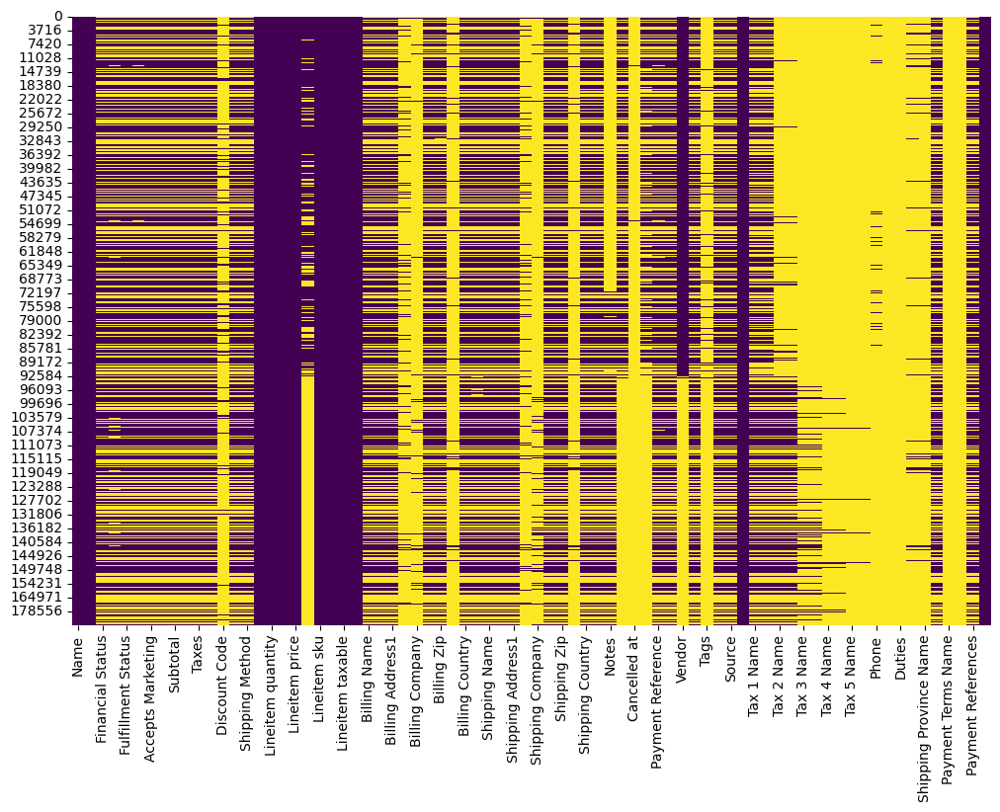

In [20]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_combined_orders.isnull(), cbar=False, cmap='viridis')
plt.show()

In [21]:
df_combined_orders.columns

Index(['Name', 'Email', 'Financial Status', 'Paid at', 'Fulfillment Status',
       'Fulfilled at', 'Accepts Marketing', 'Currency', 'Subtotal', 'Shipping',
       'Taxes', 'Total', 'Discount Code', 'Discount Amount', 'Shipping Method',
       'Created at', 'Lineitem quantity', 'Lineitem name', 'Lineitem price',
       'Lineitem compare at price', 'Lineitem sku',
       'Lineitem requires shipping', 'Lineitem taxable',
       'Lineitem fulfillment status', 'Billing Name', 'Billing Street',
       'Billing Address1', 'Billing Address2', 'Billing Company',
       'Billing City', 'Billing Zip', 'Billing Province', 'Billing Country',
       'Billing Phone', 'Shipping Name', 'Shipping Street',
       'Shipping Address1', 'Shipping Address2', 'Shipping Company',
       'Shipping City', 'Shipping Zip', 'Shipping Province',
       'Shipping Country', 'Shipping Phone', 'Notes', 'Note Attributes',
       'Cancelled at', 'Payment Method', 'Payment Reference',
       'Refunded Amount', 'Vendor', '

## deleting columns with null values along with confidential data

In [22]:
# Drop multiple columns
df_combined_orders.drop(['Email', 'Lineitem compare at price', 'Financial Status', 'Paid at', 'Fulfillment Status', 'Fulfilled at', 'Accepts Marketing', 'Currency', 'Subtotal', 'Shipping', 'Taxes', 'Total', 'Discount Code', 'Discount Amount', 'Shipping Method', 'Billing Name', 'Billing Street', 'Billing Address1', 'Billing Address2', 'Billing Company', 'Billing City', 'Billing Zip', 'Billing Province', 'Billing Country', 'Billing Phone', 'Shipping Name', 'Shipping Street', 'Shipping Address1', 'Shipping Address2', 'Shipping Company', 'Shipping City', 'Shipping Zip', 'Shipping Province', 'Shipping Country', 'Shipping Phone', 'Notes', 'Note Attributes', 'Cancelled at', 'Payment Method', 'Payment Reference', 'Refunded Amount', 'Vendor', 'Id', 'Tags', 'Risk Level', 'Source', 'Tax 1 Name', 'Tax 1 Value', 'Tax 2 Name', 'Tax 2 Value', 'Tax 3 Name', 'Tax 3 Value', 'Tax 4 Name', 'Tax 4 Value', 'Tax 5 Name', 'Tax 5 Value', 'Phone', 'Receipt Number', 'Duties', 'Billing Province Name', 'Shipping Province Name', 'Payment ID', 'Payment Terms Name', 'Next Payment Due At', 'Payment References'], axis=1, inplace=True)

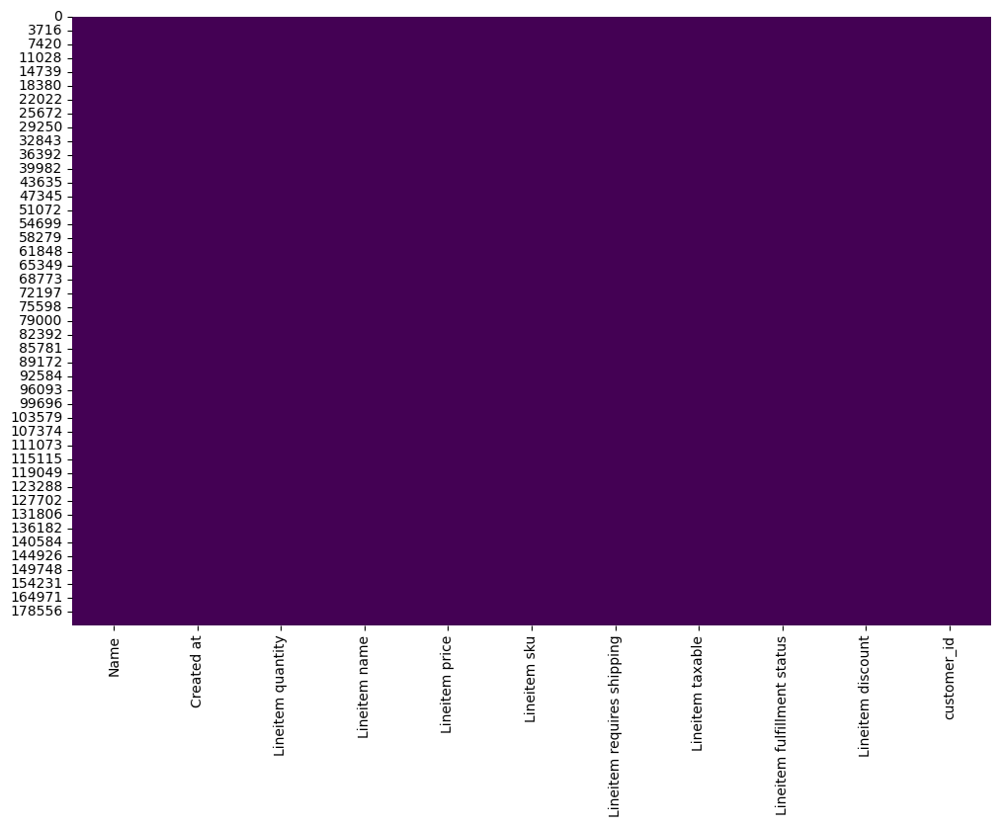

In [23]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_combined_orders.isnull(), cbar=False, cmap='viridis')
plt.show()

# Load product data

In [24]:
df_products = pd.read_csv('data/raw_data/products_export.csv')
df_products.describe(include='all')

,Handle,Title,Body (HTML),Vendor,Product Category,Type,Tags,Published,Option1 Name,Option1 Value,Option2 Name,Option2 Value,Option3 Name,Option3 Value,Variant SKU,Variant Grams,Variant Inventory Tracker,Variant Inventory Qty,Variant Inventory Policy,Variant Fulfillment Service,Variant Price,Variant Compare At Price,Variant Requires Shipping,Variant Taxable,Variant Barcode,Image Src,Image Position,Image Alt Text,Gift Card,SEO Title,SEO Description,Google Shopping / Google Product Category,Google Shopping / Gender,Google Shopping / Age Group,Google Shopping / MPN,Google Shopping / Condition,Google Shopping / Custom Product,Google Shopping / Custom Label 0,Google Shopping / Custom Label 1,Google Shopping / Custom Label 2,Google Shopping / Custom Label 3,Google Shopping / Custom Label 4,Variant Image,Variant Weight Unit,Variant Tax Code,Cost per item,Included / France,Price / France,Compare At Price / France,Included / International,Price / International,Compare At Price / International,Included / Italie,Price / Italie,Compare At Price / Italie,Status
count,663,134,133,134,86,133,133,134,134,402,130,398,0.0,0.0,402,402.000000,402,402.000000,402,402,402.000000,395.000000,402,402,398,650,650.000000,646,134,116,130,33,119,119,0.0,37,37,102,3,0.0,0.0,0.0,397,402,0.0,13.000000,134,0.0,0.0,134,0.0,0.0,134,0.0,0.0,134
unique,134,134,133,3,14,23,118,2,2,15,1,15,NaN,NaN,402,NaN,1,NaN,1,1,NaN,NaN,1,1,397,650,NaN,142,1,113,120,10,3,3,NaN,1,1,19,1,NaN,NaN,NaN,165,1,NaN,NaN,1,NaN,NaN,1,NaN,NaN,1,NaN,NaN,2
top,maillot-de-bain-sculptant-minceur,Baume réparateur mains et pieds,"<h5><span style=""color: #000000;"" data-mce-sty...",Lytess,Vêtements et accessoires > Vêtements > Sous-vê...,Legging,"Accessoires, Actif, Masque, Modèles, Nouveauté...",True,Couleur,Noir,Taille,L/XL,NaN,NaN,NEG0015,NaN,shopify,NaN,deny,manual,NaN,NaN,True,True,'3760084532794,https://cdn.shopify.com/s/files/1/0320/3773/24...,NaN,Maillot de bain Sculptant minceur - Lytess,False,Ceinture amincissante ventre plat femme Lytess...,Innovation Lytess : Découvrez notre gamme d'or...,Apparel & Accessories > Clothing > Underwear &...,female,adultes,NaN,new,False,legging,en tissus,NaN,NaN,NaN,https://cdn.shopify.com/s/files/1/0320/3773/24...,kg,NaN,NaN,True,NaN,NaN,True,NaN,NaN,True,NaN,NaN,active
freq,16,1,1,130,30,18,5,125,130,266,130,118,NaN,NaN,1,NaN,402,NaN,402,402,NaN,NaN,402,402,2,1,NaN,16,134,2,4,11,90,62,NaN,37,37,16,3,NaN,NaN,NaN,6,402,NaN,NaN,134,NaN,NaN,134,NaN,NaN,134,NaN,NaN,125
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,114.940299,NaN,36.681592,NaN,NaN,32.039080,46.604253,NaN,NaN,NaN,NaN,3.640000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.060769,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53.704060,NaN,43.442548,NaN,NaN,10.213784,13.289629,NaN,NaN,NaN,NaN,2.626685,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.420329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,NaN,NaN,0.830000,7.900000,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85.000000,NaN,16.000000,NaN,NaN,27.930000,39.900000,NaN,NaN,NaN,NaN,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.920000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,108.000000,NaN,25.000000,NaN,NaN,31.430000,44.900000,NaN,NaN,NaN,NaN,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.210000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,137.750000,NaN,42.000000,NaN,NaN,38.430000,54.900000,NaN,NaN,NaN,NaN,5.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

## since df_products isn't complete, keeping only orders with matching product's ids -> 'Variant SKU'

In [25]:
# get unique SKUs from df_products
product_skus = set(df_products['Variant SKU'])

# add new column to check if each SKU in df_orders exists in product_skus
df_combined_orders['sku_match'] = df_orders['Lineitem sku'].apply(lambda sku: sku in product_skus)
df_combined_orders.describe(include='all')

,Name,Created at,Lineitem quantity,Lineitem name,Lineitem price,Lineitem sku,Lineitem requires shipping,Lineitem taxable,Lineitem fulfillment status,Lineitem discount,customer_id,sku_match
count,148319,148319,148319.000000,148319,148319.000000,148317,148319,148319,148319,148319.000000,148319,148259
unique,83588,83554,NaN,1711,NaN,720,2,2,3,NaN,58408,2
top,5377,2020-12-05 21:30:11 +0100,NaN,Lot de 2 masques de protection en tissu réutil...,NaN,LOT200001A106/000-BLC-TU,True,True,fulfilled,NaN,'4491371249860,True
freq,38,38,NaN,1544,NaN,4158,148317,143525,147027,NaN,2621,122565
mean,NaN,NaN,1.292114,NaN,24.539844,NaN,NaN,NaN,NaN,0.064788,NaN,NaN
std,NaN,NaN,2.386783,NaN,12.344628,NaN,NaN,NaN,NaN,1.048279,NaN,NaN
min,NaN,NaN,1.000000,NaN,0.000000,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
25%,NaN,NaN,1.000000,NaN,15.960000,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
50%,NaN,NaN,1.000000,NaN,23.280000,NaN,NaN,NaN,NaN,0.000000,NaN,NaN
75%,NaN,NaN,1.000000,NaN,32.940000,NaN,NaN,NaN,NaN,0.000000,NaN,NaN


In [26]:
#delete columns where sku_match is False
df_combined_orders = df_combined_orders[df_combined_orders['sku_match'] == True]

# delete column 'sku_match' because it's no longer needed
df_combined_orders.drop(columns=['sku_match'], inplace=True)
df_combined_orders.describe(include='all')

,Name,Created at,Lineitem quantity,Lineitem name,Lineitem price,Lineitem sku,Lineitem requires shipping,Lineitem taxable,Lineitem fulfillment status,Lineitem discount,customer_id
count,122565,122565,122565.000000,122565,122565.000000,122563,122565,122565,122565,122565.000000,122565
unique,75121,75091,NaN,1150,NaN,388,2,2,3,NaN,53918
top,#127870,2021-05-07 11:24:34 +0200,NaN,Lot de 2 masques de protection en tissu réutil...,NaN,LOT200001A106/000-BLC-TU,True,True,fulfilled,NaN,'4491371249860
freq,28,28,NaN,1544,NaN,4158,122563,119749,121459,NaN,1978
mean,NaN,NaN,1.299205,NaN,24.944955,NaN,NaN,NaN,NaN,0.073289,NaN
std,NaN,NaN,2.580165,NaN,12.362322,NaN,NaN,NaN,NaN,1.112248,NaN
min,NaN,NaN,1.000000,NaN,0.000000,NaN,NaN,NaN,NaN,0.000000,NaN
25%,NaN,NaN,1.000000,NaN,16.580000,NaN,NaN,NaN,NaN,0.000000,NaN
50%,NaN,NaN,1.000000,NaN,23.940000,NaN,NaN,NaN,NaN,0.000000,NaN
75%,NaN,NaN,1.000000,NaN,33.250000,NaN,NaN,NaN,NaN,0.000000,NaN


In [34]:
# dropping rows from df_combined_orders where Lineitem sku is null 
df_combined_orders = df_combined_orders[df_combined_orders['Lineitem sku'].notnull()]
df_combined_orders.describe(include='all')

,Name,Created at,Lineitem quantity,Lineitem name,Lineitem price,Lineitem sku,Lineitem requires shipping,Lineitem taxable,Lineitem fulfillment status,Lineitem discount,customer_id
count,122563,122563,122563.000000,122563,122563.000000,122563,122563,122563,122563,122563.000000,122563
unique,75119,75089,NaN,1148,NaN,388,1,2,3,NaN,53918
top,#127870,2021-05-07 11:24:34 +0200,NaN,Lot de 2 masques de protection en tissu réutil...,NaN,LOT200001A106/000-BLC-TU,True,True,fulfilled,NaN,'4491371249860
freq,28,28,NaN,1544,NaN,4158,122563,119749,121457,NaN,1978
mean,NaN,NaN,1.299209,NaN,24.945199,NaN,NaN,NaN,NaN,0.073291,NaN
std,NaN,NaN,2.580186,NaN,12.362275,NaN,NaN,NaN,NaN,1.112257,NaN
min,NaN,NaN,1.000000,NaN,0.000000,NaN,NaN,NaN,NaN,0.000000,NaN
25%,NaN,NaN,1.000000,NaN,16.580000,NaN,NaN,NaN,NaN,0.000000,NaN
50%,NaN,NaN,1.000000,NaN,23.940000,NaN,NaN,NaN,NaN,0.000000,NaN
75%,NaN,NaN,1.000000,NaN,33.250000,NaN,NaN,NaN,NaN,0.000000,NaN


## Save the filtered orders DataFrame to a CSV file

In [35]:
df_combined_orders.to_csv('data/cleaned_data/orders.csv', index=False)

## dropping confidential columns in df_customers

In [28]:
df_customers.describe(include='all')

,Customer ID,First Name,Last Name,Email,Accepts Email Marketing,Default Address Company,Default Address Address1,Default Address Address2,Default Address City,Default Address Province Code,Default Address Country Code,Default Address Zip,Default Address Phone,Phone,Accepts SMS Marketing,Total Spent,Total Orders,Note,Tax Exempt,Tags
count,78922,74107,74035,76135,78922,4182,71739,15490,71740,7069,72792,71727,71594,26707,78922,78922.000000,78922.000000,770,78922,8794
unique,78922,17799,51546,76135,2,3373,69281,13081,32606,157,31,9497,70080,26707,2,NaN,NaN,756,2,2750
top,'3220287651979,Nathalie,Nathalie,lailaembarek@yahoo.fr,no,Madame,"Sovereign SNS, 4 Rue de la Presse (par la rue ...",1,Paris,RM,FR,75015,'+33 4 83 53 08 88,33611233582,no,NaN,NaN,flits_referral_code: 1jCqZ7125442,no,#wgfr#wg
freq,1,811,140,1,55275,121,32,63,1762,652,62635,260,38,1,76309,NaN,NaN,5,78918,3485
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.144868,1.156129,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,226.580644,4.232468,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.940000,1.000000,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.430000,1.000000,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.350000,1.000000,NaN,NaN,NaN


In [29]:
df_customers.drop(['First Name', 'Last Name', 'Email', 'Default Address Address1', 'Default Address Address2', 'Default Address Phone', 'Phone'], axis=1, inplace=True)

## visualizing null values in df_customers

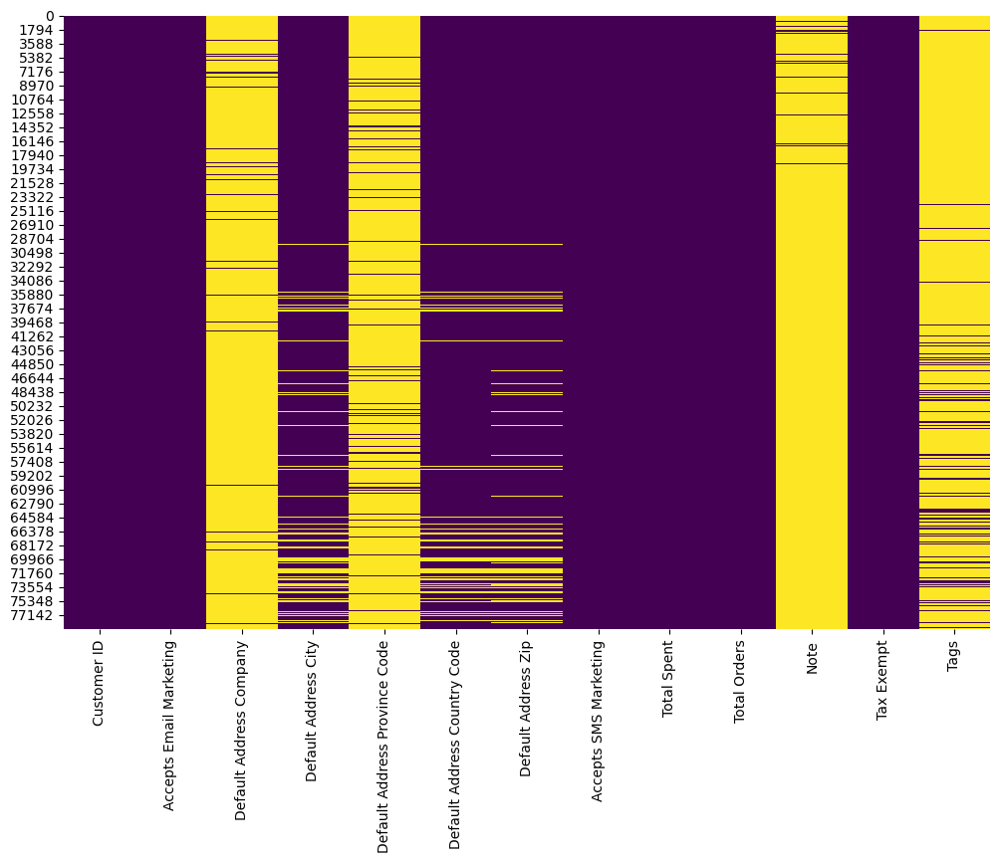

In [30]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_customers.isnull(), cbar=False, cmap='viridis')
plt.show()

## dropping irrelevant columns with a lot of null values

In [31]:
# Drop multiple columns
df_customers.drop(['Default Address Province Code', 'Note', 'Tags'], axis=1, inplace=True)

In [32]:
# Save the filtered products DataFrame to a CSV file
df_customers.to_csv('data/cleaned_data/customers.csv', index=False)

## visualizing null values in df_products

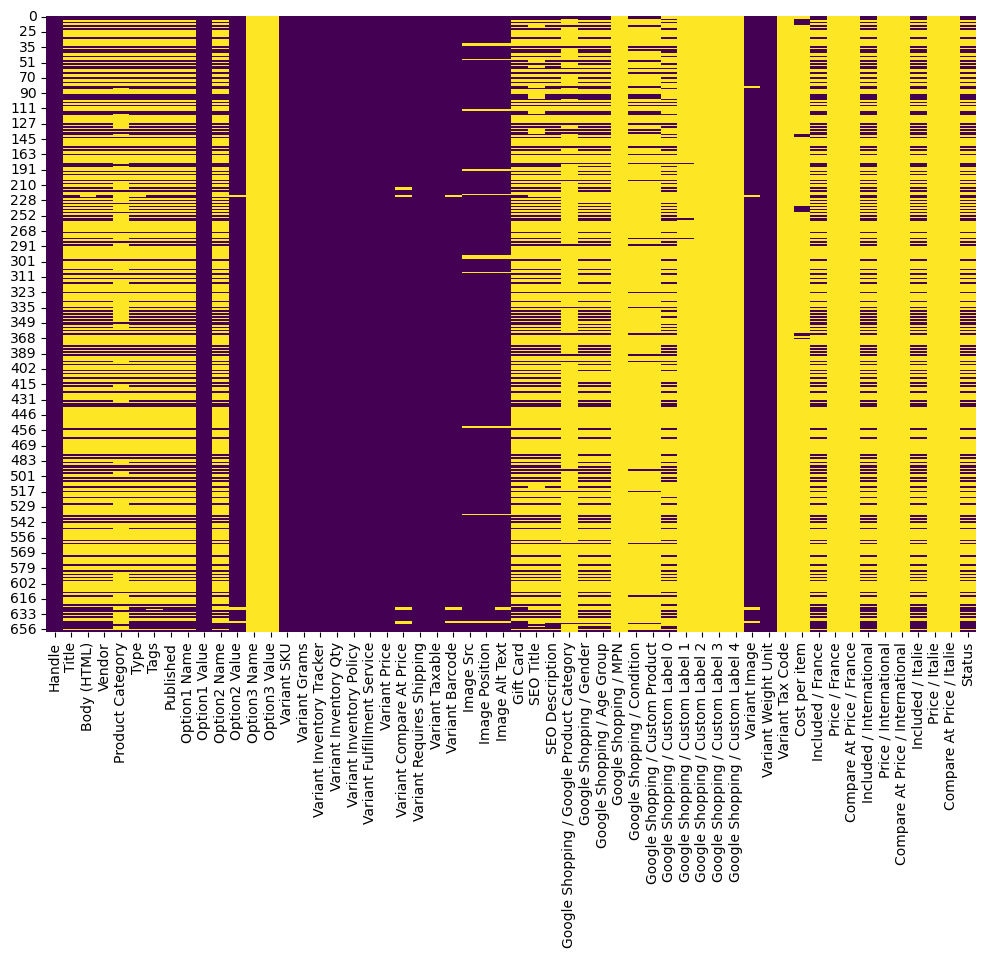

In [33]:
# dropping rows where Variant SKU is null
df_products = df_products[df_products['Variant SKU'].notnull()]
plt.figure(figsize=(12, 8))
sns.heatmap(df_products.isnull(), cbar=False, cmap='viridis')
plt.show()

In [36]:
df_products.describe(include='all')

,Handle,Title,Body (HTML),Vendor,Product Category,Type,Tags,Published,Option1 Name,Option1 Value,Option2 Name,Option2 Value,Option3 Name,Option3 Value,Variant SKU,Variant Grams,Variant Inventory Tracker,Variant Inventory Qty,Variant Inventory Policy,Variant Fulfillment Service,Variant Price,Variant Compare At Price,Variant Requires Shipping,Variant Taxable,Variant Barcode,Image Src,Image Position,Image Alt Text,Gift Card,SEO Title,SEO Description,Google Shopping / Google Product Category,Google Shopping / Gender,Google Shopping / Age Group,Google Shopping / MPN,Google Shopping / Condition,Google Shopping / Custom Product,Google Shopping / Custom Label 0,Google Shopping / Custom Label 1,Google Shopping / Custom Label 2,Google Shopping / Custom Label 3,Google Shopping / Custom Label 4,Variant Image,Variant Weight Unit,Variant Tax Code,Cost per item,Included / France,Price / France,Compare At Price / France,Included / International,Price / International,Compare At Price / International,Included / Italie,Price / Italie,Compare At Price / Italie,Status
count,402,134,133,134,86,133,133,134,134,402,130,398,0.0,0.0,402,402.000000,402,402.000000,402,402,402.000000,395.000000,402,402,398,389,389.000000,387,134,116,130,33,119,119,0.0,37,37,102,3,0.0,0.0,0.0,397,402,0.0,13.000000,134,0.0,0.0,134,0.0,0.0,134,0.0,0.0,134
unique,134,134,133,3,14,23,118,2,2,15,1,15,NaN,NaN,402,NaN,1,NaN,1,1,NaN,NaN,1,1,397,389,NaN,138,1,113,120,10,3,3,NaN,1,1,19,1,NaN,NaN,NaN,165,1,NaN,NaN,1,NaN,NaN,1,NaN,NaN,1,NaN,NaN,2
top,culotte-amincissante-ventre-plat,Baume réparateur mains et pieds,"<h5><span style=""color: #000000;"" data-mce-sty...",Lytess,Vêtements et accessoires > Vêtements > Sous-vê...,Legging,"Accessoires, Actif, Masque, Modèles, Nouveauté...",True,Couleur,Noir,Taille,L/XL,NaN,NaN,NEG0015,NaN,shopify,NaN,deny,manual,NaN,NaN,True,True,'3760084532794,https://cdn.shopify.com/s/files/1/0320/3773/24...,NaN,Culotte amincissante Ventre Plat - Lytess,False,Ceinture amincissante ventre plat femme Lytess...,Innovation Lytess : Découvrez notre gamme d'or...,Apparel & Accessories > Clothing > Underwear &...,female,adultes,NaN,new,False,legging,en tissus,NaN,NaN,NaN,https://cdn.shopify.com/s/files/1/0320/3773/24...,kg,NaN,NaN,True,NaN,NaN,True,NaN,NaN,True,NaN,NaN,active
freq,15,1,1,130,30,18,5,125,130,266,130,118,NaN,NaN,1,NaN,402,NaN,402,402,NaN,NaN,402,402,2,1,NaN,14,134,2,4,11,90,62,NaN,37,37,16,3,NaN,NaN,NaN,6,402,NaN,NaN,134,NaN,NaN,134,NaN,NaN,134,NaN,NaN,125
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,114.940299,NaN,36.681592,NaN,NaN,32.039080,46.604253,NaN,NaN,NaN,NaN,2.745501,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.060769,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53.704060,NaN,43.442548,NaN,NaN,10.213784,13.289629,NaN,NaN,NaN,NaN,2.170446,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.420329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,NaN,NaN,0.830000,7.900000,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85.000000,NaN,16.000000,NaN,NaN,27.930000,39.900000,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.920000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,108.000000,NaN,25.000000,NaN,NaN,31.430000,44.900000,NaN,NaN,NaN,NaN,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.210000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,137.750000,NaN,42.000000,NaN,NaN,38.430000,54.900000,NaN,NaN,NaN,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

## dropping irrelevant columns with a lot of null values

In [37]:
# Drop multiple columns
df_products.drop(['Vendor', 'Option1 Name', 'Option2 Name', 'Option3 Name', 'Option3 Value', 'Variant Inventory Tracker', 'Variant Inventory Policy', 'Variant Fulfillment Service', 'Variant Requires Shipping', 'Variant Taxable', 'Variant Barcode', 'Image Src', 'Image Position', 'Image Alt Text', 'Gift Card', 'Google Shopping / MPN', 'Google Shopping / Custom Label 2', 'Google Shopping / Custom Label 3', 'Google Shopping / Custom Label 4', 'Variant Image', 'Variant Weight Unit', 'Variant Tax Code', 'Price / France', 'Compare At Price / France', 'Included / International', 'Price / International', 'Compare At Price / International','Google Shopping / Condition', 'Google Shopping / Custom Product', 'Google Shopping / Custom Label 1', 'Included / France', 'Included / Italie', 'Price / Italie', 'Compare At Price / Italie'], axis=1, inplace=True)

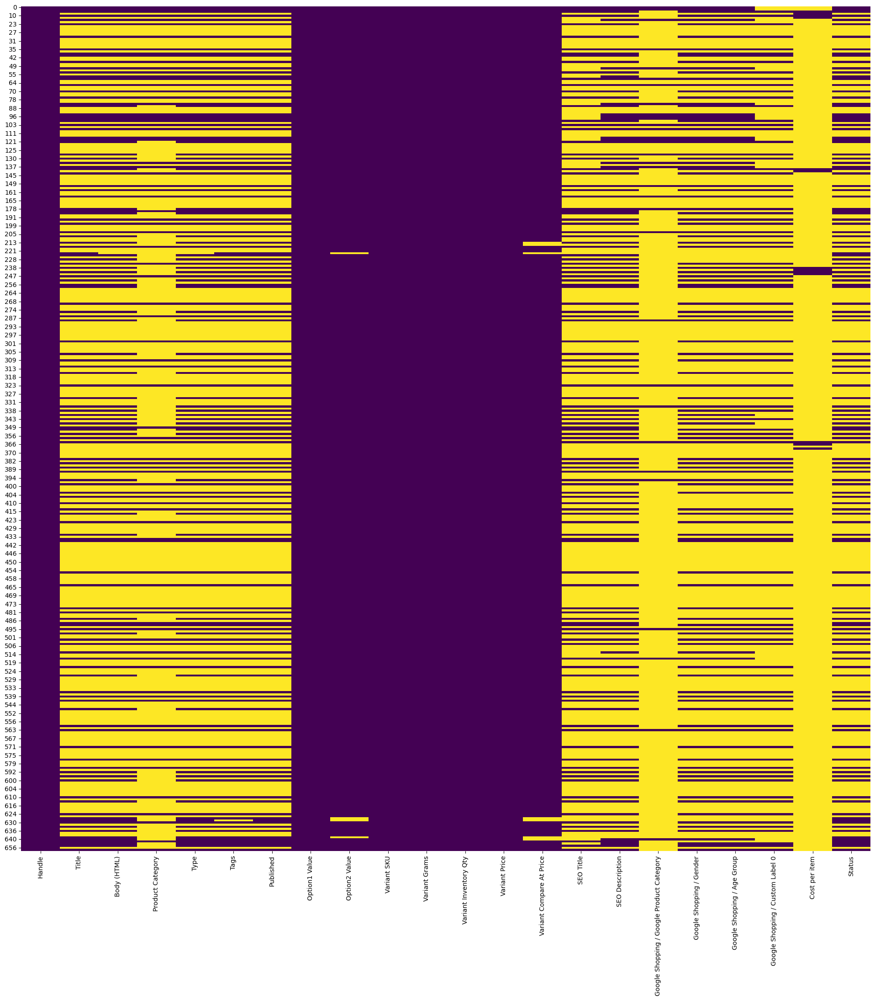

In [38]:
# dropping rows where Variant SKU is null
df_products = df_products[df_products['Variant SKU'].notnull()]
plt.figure(figsize=(24, 24))
sns.heatmap(df_products.isnull(), cbar=False, cmap='viridis')
plt.show()

In [39]:
df_products.describe(include='all')

,Handle,Title,Body (HTML),Product Category,Type,Tags,Published,Option1 Value,Option2 Value,Variant SKU,Variant Grams,Variant Inventory Qty,Variant Price,Variant Compare At Price,SEO Title,SEO Description,Google Shopping / Google Product Category,Google Shopping / Gender,Google Shopping / Age Group,Google Shopping / Custom Label 0,Cost per item,Status
count,402,134,133,86,133,133,134,402,398,402,402.000000,402.000000,402.000000,395.000000,116,130,33,119,119,102,13.000000,134
unique,134,134,133,14,23,118,2,15,15,402,NaN,NaN,NaN,NaN,113,120,10,3,3,19,NaN,2
top,culotte-amincissante-ventre-plat,Baume réparateur mains et pieds,"<h5><span style=""color: #000000;"" data-mce-sty...",Vêtements et accessoires > Vêtements > Sous-vê...,Legging,"Accessoires, Actif, Masque, Modèles, Nouveauté...",True,Noir,L/XL,NEG0015,NaN,NaN,NaN,NaN,Ceinture amincissante ventre plat femme Lytess...,Innovation Lytess : Découvrez notre gamme d'or...,Apparel & Accessories > Clothing > Underwear &...,female,adultes,legging,NaN,active
freq,15,1,1,30,18,5,125,266,118,1,NaN,NaN,NaN,NaN,2,4,11,90,62,16,NaN,125
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,114.940299,36.681592,32.039080,46.604253,NaN,NaN,NaN,NaN,NaN,NaN,8.060769,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53.704060,43.442548,10.213784,13.289629,NaN,NaN,NaN,NaN,NaN,NaN,2.420329,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.830000,7.900000,NaN,NaN,NaN,NaN,NaN,NaN,6.750000,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85.000000,16.000000,27.930000,39.900000,NaN,NaN,NaN,NaN,NaN,NaN,6.920000,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,108.000000,25.000000,31.430000,44.900000,NaN,NaN,NaN,NaN,NaN,NaN,7.210000,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,137.750000,42.000000,38.430000,54.900000,NaN,NaN,NaN,NaN,NaN,NaN,7.210000,NaN


# Saving filtered[not completely] products

In [40]:
df_products.to_csv('data/cleaned_data/products.csv', index=False)

# Load all clean data

In [41]:
df_customers = pd.read_csv('data/cleaned_data/customers.csv')
df_products = pd.read_csv('data/cleaned_data/products.csv')
df_orders = pd.read_csv('data/cleaned_data/orders.csv')

In [31]:
"""# Create a set of unique SKUs from the products DataFrame
product_skus = set(df_products['Variant SKU'])

# Drop rows where 'Lineitem sku' is null
df_orders = df_orders[df_orders['Lineitem sku'].notna()]

# Check if each SKU in the orders DataFrame exists in the product_skus set
df_orders['sku_match'] = df_orders['Lineitem sku'].apply(lambda sku: sku in product_skus)

# Drop rows where sku_match is False
df_orders = df_orders[df_orders['sku_match'] == True]

# Drop the 'sku_match' column as it's no longer needed
df_orders.drop(columns=['sku_match'], inplace=True)"""

# df_customers Viszualizing every column
## changing columns names

In [42]:
df_customers.describe(include='all')

,Customer ID,Accepts Email Marketing,Default Address Company,Default Address City,Default Address Country Code,Default Address Zip,Accepts SMS Marketing,Total Spent,Total Orders,Tax Exempt
count,78922,78922,4182,71740,72792,71727,78922,78922.000000,78922.000000,78922
unique,78922,2,3373,32606,31,9497,2,NaN,NaN,2
top,'3220287651979,no,Madame,Paris,FR,75015,no,NaN,NaN,no
freq,1,55275,121,1762,62635,260,76309,NaN,NaN,78918
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.144868,1.156129,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,226.580644,4.232468,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.940000,1.000000,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.430000,1.000000,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.350000,1.000000,NaN


In [43]:
#renaming columns for clarity
df_customers.rename(columns={'Customer ID': 'customer_id'}, inplace=True)
df_customers.rename(columns={'Accepts Email Marketing': 'accepts_email_marketing'}, inplace=True)
df_customers.rename(columns={'Default Address Company': 'default_address_company'}, inplace=True)
df_customers.rename(columns={'Default Address City': 'default_address_city'}, inplace=True)
df_customers.rename(columns={'Default Address Country Code': 'default_address_country_code'}, inplace=True)
df_customers.rename(columns={'Default Address Zip': 'default_address_zip'}, inplace=True)
df_customers.rename(columns={'Accepts SMS Marketing': 'accepts_sms_marketing'}, inplace=True)
df_customers.rename(columns={'Total Spent': 'total_spent'}, inplace=True)
df_customers.rename(columns={'Total Orders': 'total_orders'}, inplace=True)
df_customers.rename(columns={'Tax Exempt': 'tax_exempt'}, inplace=True)

In [44]:
# 8888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888888
# Set pandas display options to show all columns
pd.set_option('display.max_columns', None)
df_customers.head()

,customer_id,accepts_email_marketing,default_address_company,default_address_city,default_address_country_code,default_address_zip,accepts_sms_marketing,total_spent,total_orders,tax_exempt
0,'3220287651979,yes,NaN,Roma,IT,'00184,no,135.17,11,no
1,'4464852369604,no,NaN,FONDETTES,FR,37300,no,9.89,1,no
2,'4470765650116,no,NaN,Guulherand granges,FR,'07500,no,26.91,1,no
3,'4470882533572,no,NaN,Ecully,FR,69130,no,39.93,1,no
4,'4471456465092,no,NaN,Sainte Croix hague,FR,50440,no,200.40,2,no


In [45]:
# Check for missing values
print(df_customers.isnull().sum())

customer_id                         0
accepts_email_marketing             0
default_address_company         74740
default_address_city             7182
default_address_country_code     6130
default_address_zip              7195
accepts_sms_marketing               0
total_spent                         0
total_orders                        0
tax_exempt                          0
dtype: int64


## checking every column seperately in df_customers

## df_customers['accepts_email_marketing'] distribution

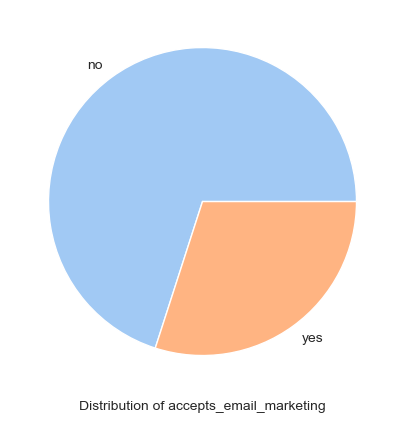

In [46]:
pie_data = df_customers[['customer_id', 'accepts_email_marketing']].groupby('accepts_email_marketing').count()
sns.set_style("darkgrid")
f, ax = plt.subplots(figsize=(10,5))
colors = sns.color_palette('pastel')
ax.pie(pie_data.customer_id, labels=pie_data.index, colors = colors)
ax.set_facecolor('lightgrey')
ax.set_xlabel('Distribution of accepts_email_marketing')
plt.show()

## df_customers['default_address_company_status'] distribution

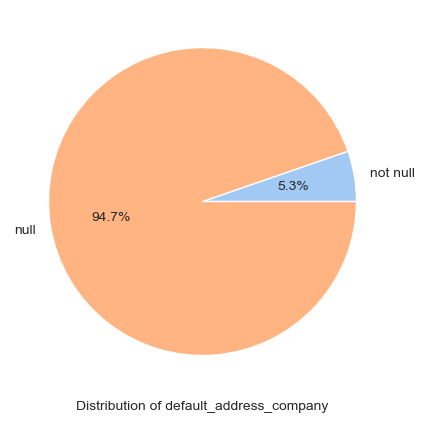

In [47]:
# Create a new column 'default_address_company_status' to indicate null status
df_customers['default_address_company_status'] = df_customers['default_address_company'].apply(
    lambda x: 'not null' if pd.notna(x) else 'null'
)

# Group by the new column and count the occurrences
pie_data = df_customers.groupby('default_address_company_status').size()

# Plot the pie chart
sns.set_style("darkgrid")
f, ax = plt.subplots(figsize=(10, 5))
colors = sns.color_palette('pastel')
ax.pie(pie_data, labels=pie_data.index, colors=colors, autopct='%1.1f%%')
ax.set_facecolor('lightgrey')
ax.set_xlabel('Distribution of default_address_company')
plt.show()

## dropping column (irrelevant)

In [48]:
df_customers.drop(columns=['default_address_company'], inplace=True)

## (pie)plot df_customers['default_address_city'] top 50 most common

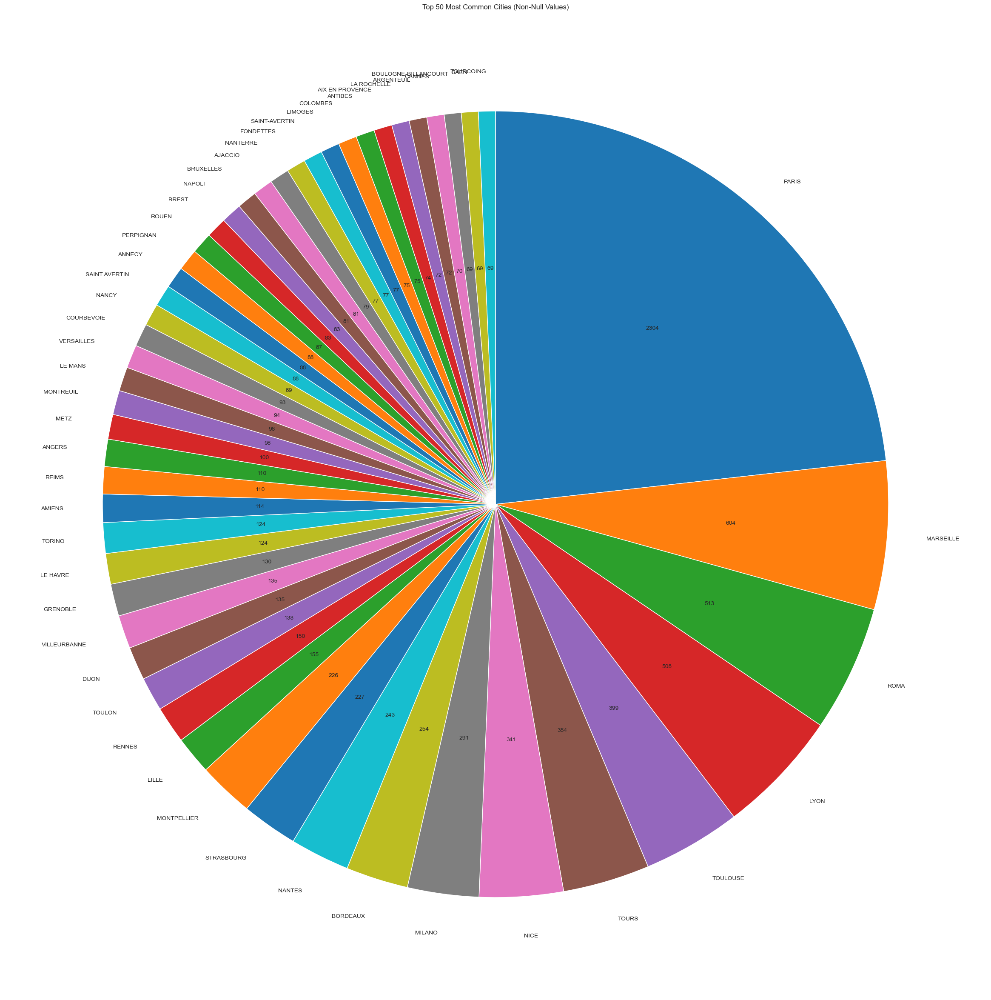

In [49]:
df_customers['default_address_city'] = df_customers['default_address_city'].str.upper()

column_city= 'default_address_city'

non_null_values_city = df_customers[column_city].dropna()
value_counts_city = non_null_values_city.value_counts()

top_50_values_city = value_counts_city.head(50)

# function to display frequencies
def func(pct, allvalues):
    absolute = int(pct/100.*sum(allvalues))
    return "{:d}".format(absolute)

# Plot
plt.figure(figsize=(30, 30))
top_50_values_city.plot(kind='pie', autopct=lambda pct: func(pct, top_50_values_city), startangle=90, counterclock=False)
plt.title('Top 50 Most Common Cities (Non-Null Values)')
plt.ylabel('')
plt.show()

## word cloud default_address_city

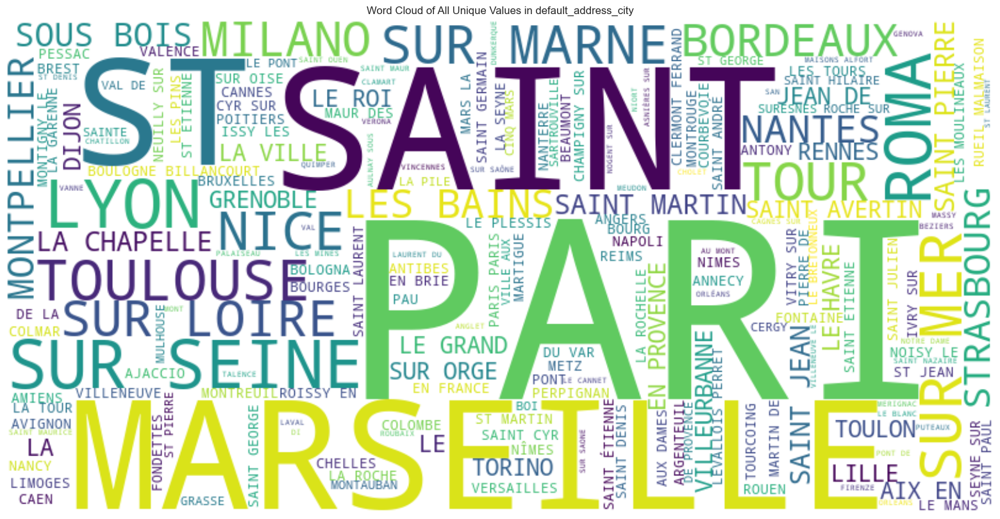

In [50]:
# Combine all cities into a single string
text_city = ' '.join(non_null_values_city.dropna().astype(str))

# Generate wordcloud
wordcloud_city = WordCloud(width=800, height=400, background_color='white').generate(text_city)

# plot
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud_city, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of All Unique Values in default_address_city')
plt.show()

In [53]:
df_customers.describe(include='all')

,customer_id,accepts_email_marketing,default_address_city,default_address_country_code,default_address_zip,accepts_sms_marketing,total_spent,total_orders,tax_exempt,default_address_company_status
count,78922,78922,71740,72792,71727,78922,78922.000000,78922.000000,78922,78922
unique,78922,2,24365,31,9497,2,NaN,NaN,2,2
top,'3220287651979,no,PARIS,FR,75015,no,NaN,NaN,no,null
freq,1,55275,2304,62635,260,76309,NaN,NaN,78918,74740
mean,NaN,NaN,NaN,NaN,NaN,NaN,60.144868,1.156129,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,226.580644,4.232468,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,22.940000,1.000000,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,38.430000,1.000000,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,63.350000,1.000000,NaN,NaN


## 'default_address_country_code' distribution

default_address_country_code
FR     62635
IT      7223
NaN     6130
BE      1475
CH       243
RE       188
GB       158
GP       145
MQ       139
ES       129
DE        67
US        66
LU        51
PT        49
MC        40
GF        38
RO        30
PF        25
YT        22
NC        19
NL        10
AT         7
CA         7
BL         5
MF         5
SE         4
PM         3
MU         3
PL         3
AF         1
HU         1
CZ         1
Name: count, dtype: int64


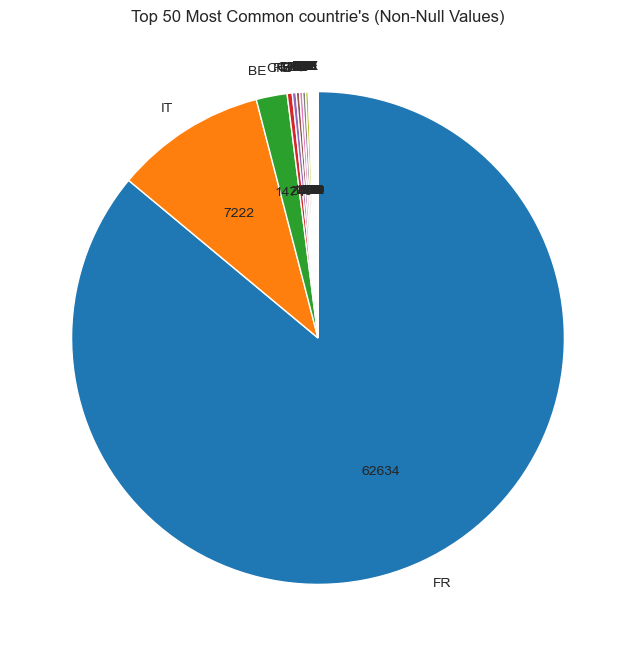

In [54]:
# Print the unique values and their counts
column_country = 'default_address_country_code'
value_counts_country = df_customers[column_country].value_counts(dropna=False)
print(value_counts_country)


non_null_values_country = df_customers[column_country].dropna()
value_counts_country = non_null_values_country.value_counts()
top_50_values_country = value_counts_country.head(50)

# func to display frequencies
def func(pct, allvalues):
    absolute = int(pct/100.*sum(allvalues))
    return "{:d}".format(absolute)

# Plot
plt.figure(figsize=(16, 8))
top_50_values_country.plot(kind='pie', autopct=lambda pct: func(pct, top_50_values_country), startangle=90, counterclock=False)
plt.title('Top 50 Most Common countrie\'s (Non-Null Values)')
plt.ylabel('')
plt.show()

## word cloud default_address_country_code

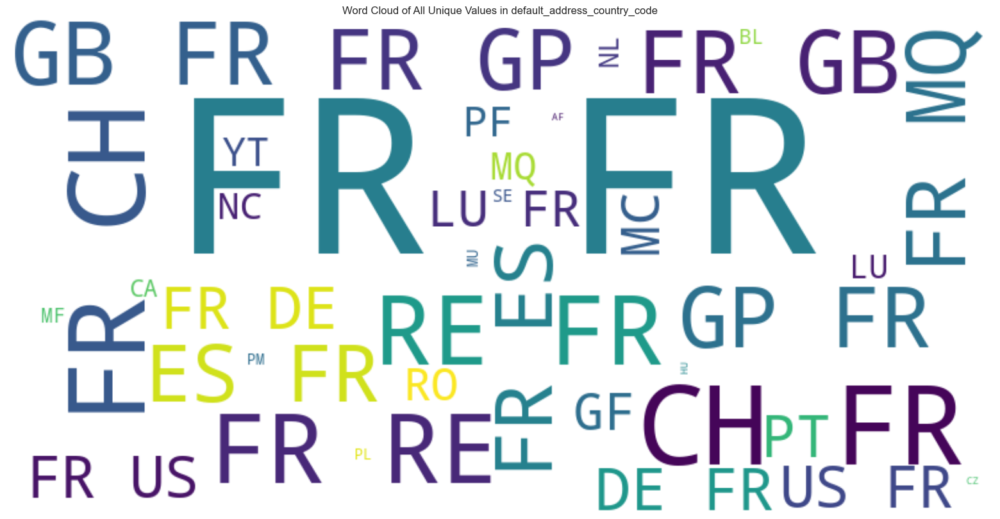

In [55]:
non_null_values_country = df_customers[column_country].dropna()
text_country = ' '.join(non_null_values_country.dropna().astype(str))

# Generate a word cloud
wordcloud_country = WordCloud(width=800, height=400, background_color='white').generate(text_country)

# plot
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud_country, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of All Unique Values in default_address_country_code')
plt.show()

## plot df_customers['default_address_zip']

default_address_zip
NaN      7195
75015     260
37000     228
37550     201
75017     196
         ... 
6030        1
80018       1
87029       1
87055       1
9190        1
Name: count, Length: 9498, dtype: int64


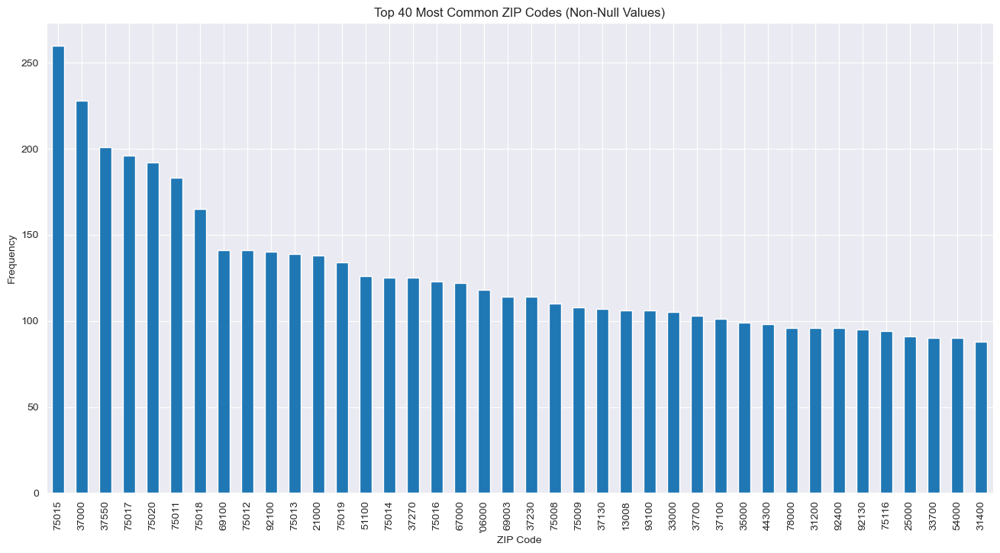

In [56]:
# Print the unique values and their counts
column_name_zip = 'default_address_zip'
value_counts_zip = df_customers[column_name_zip].value_counts(dropna=False)
print(value_counts_zip)

non_null_values_zip = df_customers[column_name_zip].dropna()
value_counts_zip = non_null_values_zip.value_counts()
top_40_values_zip = value_counts_zip.head(40)

# Plot
plt.figure(figsize=(16, 8))
top_40_values_zip.plot(kind='bar')
plt.title('Top 40 Most Common ZIP Codes (Non-Null Values)')
plt.xlabel('ZIP Code')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.show()

## df_customers['accepts_sms_marketing'] distribution

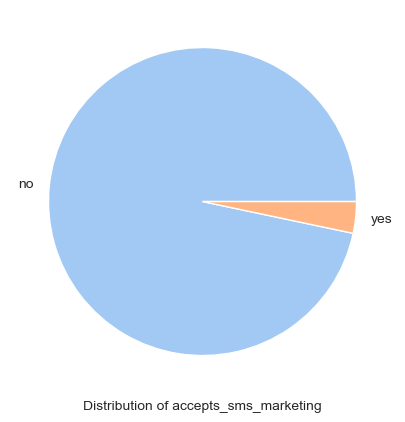

In [58]:
pie_data = df_customers[['customer_id', 'accepts_sms_marketing']].groupby('accepts_sms_marketing').count()
sns.set_style("darkgrid")
f, ax = plt.subplots(figsize=(10,5))
colors = sns.color_palette('pastel')
ax.pie(pie_data.customer_id, labels=pie_data.index, colors = colors)
ax.set_facecolor('lightgrey')
ax.set_xlabel('Distribution of accepts_sms_marketing')
plt.show()

## Drop the 'default_address_company' column (irrelevant)

In [59]:
df_customers.drop(columns=['tax_exempt'], inplace=True)

Column: customer_id
Missing Values: 0 (0.00%)


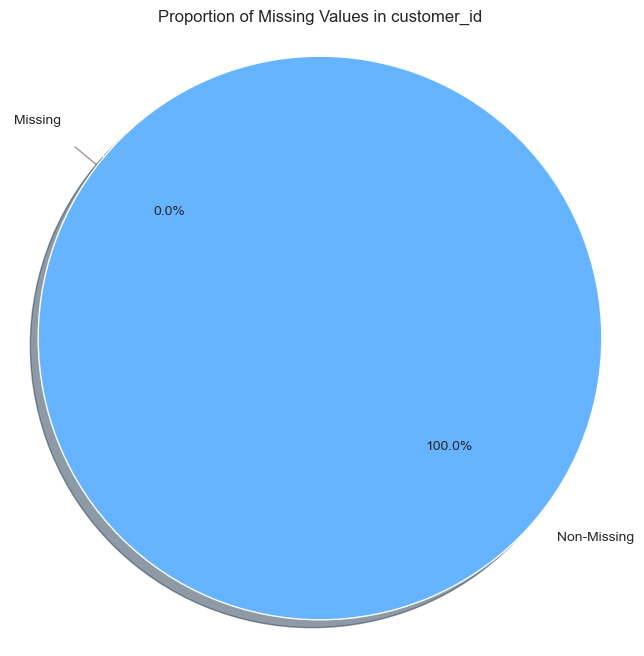

Column: accepts_email_marketing
Missing Values: 0 (0.00%)


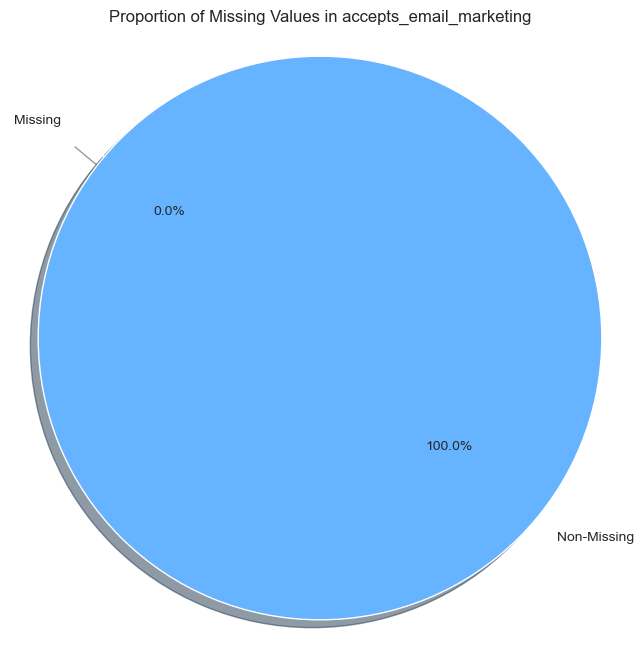

Column: default_address_city
Missing Values: 7182 (9.10%)


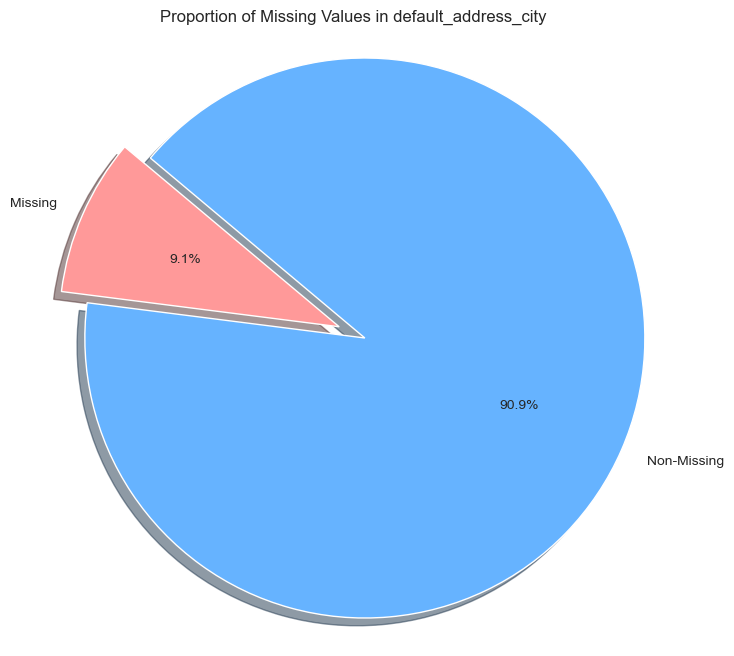

Column: default_address_country_code
Missing Values: 6130 (7.77%)


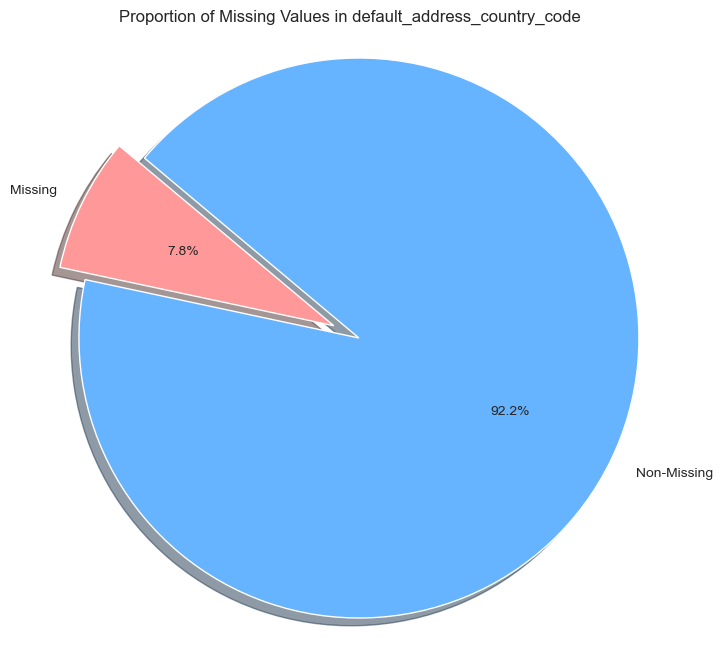

Column: default_address_zip
Missing Values: 7195 (9.12%)


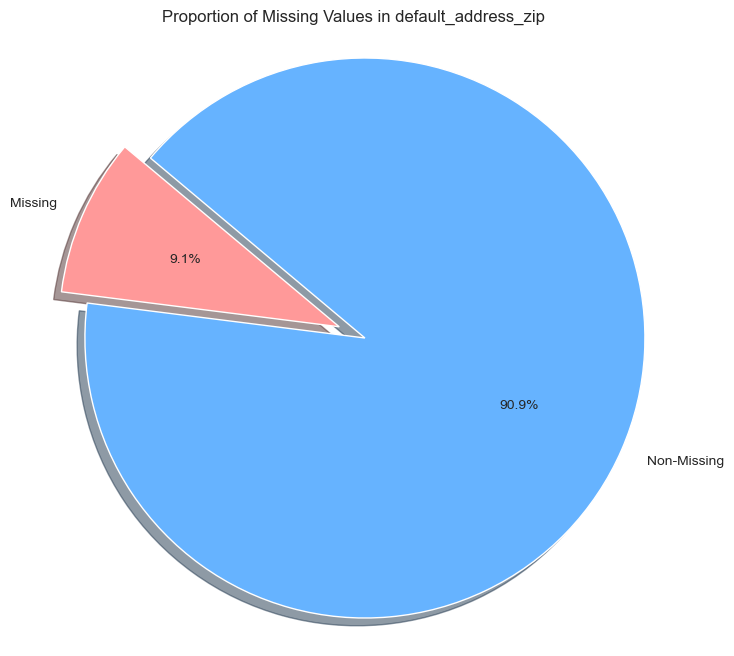

Column: accepts_sms_marketing
Missing Values: 0 (0.00%)


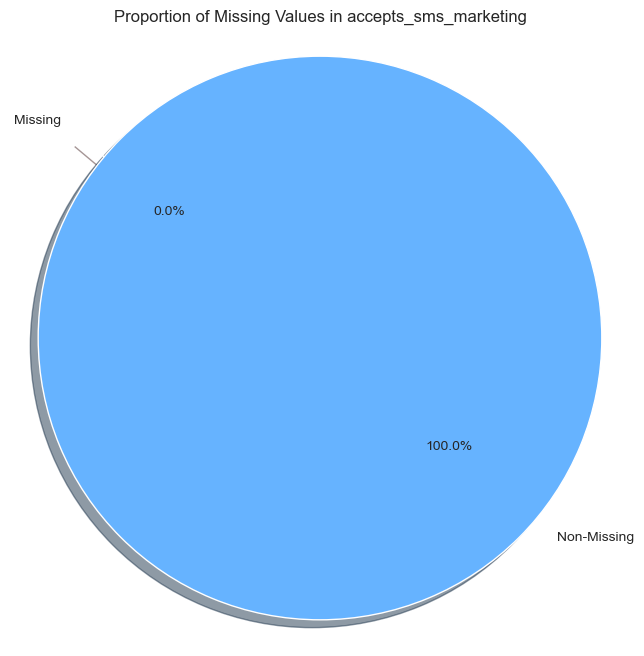

Column: default_address_company_status
Missing Values: 0 (0.00%)


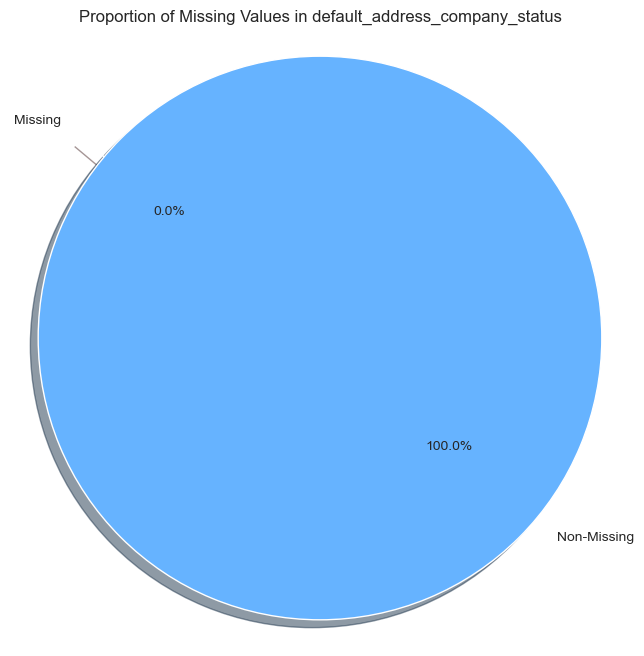

In [51]:
"""# Select categorical columns
categorical_columns = df_customers.select_dtypes(include=['object', 'category']).columns

# Iterate over each categorical column to calculate and plot missing values percentages
for col in categorical_columns:
    # Calculate the proportion of missing values
    missing_values_count = df_customers[col].isnull().sum()
    total_values_count = df_customers[col].shape[0]
    missing_values_percentage = (missing_values_count / total_values_count) * 100
    not_missing_values_percentage = 100 - missing_values_percentage
    
    # Display the missing values percentage
    print(f"Column: {col}")
    print(f"Missing Values: {missing_values_count} ({missing_values_percentage:.2f}%)")
    
    # Plotting
    labels = ['Missing', 'Non-Missing']
    sizes = [missing_values_percentage, not_missing_values_percentage]
    colors = ['#ff9999','#66b3ff']
    explode = (0.1, 0)  # explode 1st slice
    
    plt.figure(figsize=(8, 8))
    plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',
            shadow=True, startangle=140)
    plt.title(f'Proportion of Missing Values in {col}')
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.show()"""

# Numerical values in df_customers

c:\Users\moham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\moham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


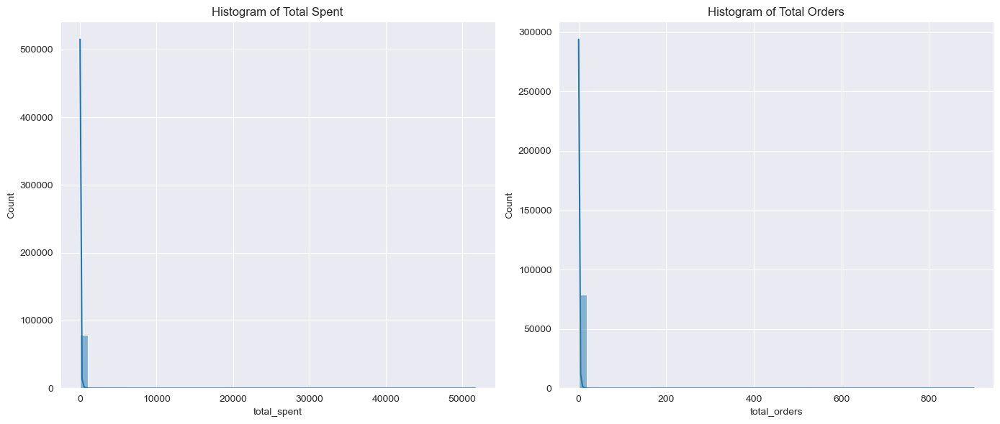

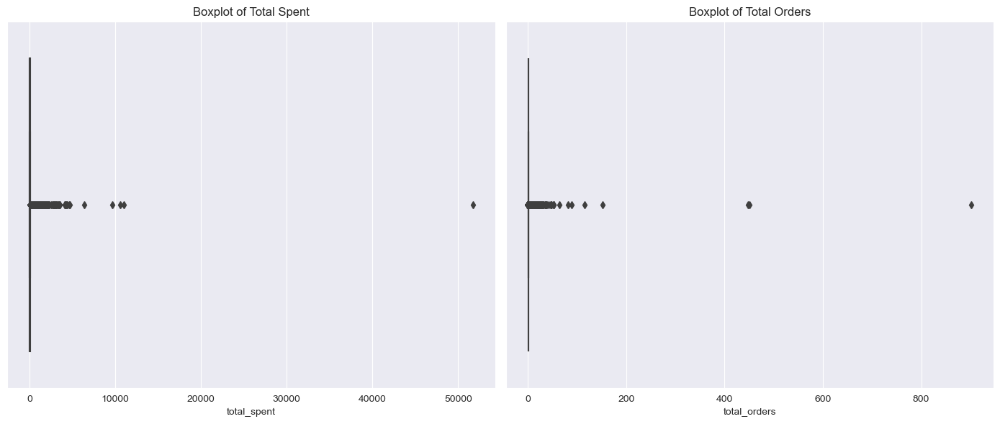

In [60]:
# Plotting multiple graphs in a grid
# Exploring the distribution of numeric columns 
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(df_customers['total_spent'], bins=50, kde=True)
plt.title('Histogram of Total Spent')

plt.subplot(1, 2, 2)
sns.histplot(df_customers['total_orders'], bins=50, kde=True)
plt.title('Histogram of Total Orders')

plt.tight_layout()
plt.show()

# Boxplots
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x=df_customers['total_spent'])
plt.title('Boxplot of Total Spent')

plt.subplot(1, 2, 2)
sns.boxplot(x=df_customers['total_orders'])
plt.title('Boxplot of Total Orders')

plt.tight_layout()
plt.show()

In [61]:
# Get the top 50 rows with the highest 'total_spent'
top_50spent_customers = df_customers.nlargest(50, 'total_spent')

# Print the result
top_50spent_customers.head(50)

,customer_id,accepts_email_marketing,default_address_city,default_address_country_code,default_address_zip,accepts_sms_marketing,total_spent,total_orders,default_address_company_status
682,'4491640078532,yes,LE PALLET,FR,44330,no,51699.07,152,not null
430,'4491500945604,yes,MORTEAU,FR,25500,no,10989.49,37,null
142,'4491305910468,no,RUEIL MALMAISON,FR,92500,no,10622.10,89,null
603,'4491590959300,yes,RENNES,FR,35000,no,9669.36,47,null
16182,'4493279690948,yes,ROISSY-EN-FRANCE,FR,95700,no,6398.71,64,not null
730,'4491670290628,yes,MARCQ EN BAROEUL,FR,59700,no,4735.45,48,null
42923,'5743021031620,yes,PELLENBERG,BE,3212,no,4648.66,25,null
47619,'5896752529604,no,GRANDVILLERS,FR,60210,no,4375.00,1,not null
887,'4491776852164,yes,CANNES,FR,'06400,no,4363.67,53,null
2287,'4492200018116,no,REICHSFELD,FR,67140,no,4286.64,81,null


In [62]:
# Get the top 50 rows with the highest 'total_orders'
top_50orders_customers = df_customers.nlargest(50, 'total_orders')

# Print the result
top_50orders_customers.head(50)

,customer_id,accepts_email_marketing,default_address_city,default_address_country_code,default_address_zip,accepts_sms_marketing,total_spent,total_orders,default_address_company_status
221,'4491371249860,yes,VEIGNE,FR,37250,no,410.42,902,null
222,'4491371282628,yes,FONDETTES,FR,37230,no,0.00,450,not null
140,'4491303125188,no,FONDETTES,FR,37230,no,0.00,447,not null
682,'4491640078532,yes,LE PALLET,FR,44330,no,51699.07,152,not null
1110,'4491944100036,no,FONDETTES,FR,37230,no,171.64,115,not null
142,'4491305910468,no,RUEIL MALMAISON,FR,92500,no,10622.10,89,null
2287,'4492200018116,no,REICHSFELD,FR,67140,no,4286.64,81,null
16182,'4493279690948,yes,ROISSY-EN-FRANCE,FR,95700,no,6398.71,64,not null
887,'4491776852164,yes,CANNES,FR,'06400,no,4363.67,53,null
742,'4491675369668,yes,FREJUS,FR,83600,no,2292.06,52,null


## inaccurate data, some errors  like total_spent: 0.00 |	total_orders: 450

In [65]:
# defining condition
condition = (df_customers['total_spent'] == 0.00) & (df_customers['total_orders'] > 2)

# Extract customer_id of rows that meet the condition
inaccurate_customer_ids = df_customers.loc[condition, 'customer_id']

# Display the customer_ids of the inaccurate rows
print(f"Customer IDs with inaccurate data:\n{inaccurate_customer_ids}")

Customer IDs with inaccurate data:
140      '4491303125188
222      '4491371282628
27629    '5033782706372
29303    '5140204748996
30480    '5197244104900
32805    '5327763046596
33118    '5339578826948
36574    '5528406425796
37465    '5604410917060
38064    '5628857974980
44481    '5769310142660
49214    '5959505182916
50859    '6042025164996
51593    '6071228629188
54057    '6220183208132
54629    '6234414153924
57534    '6280791982276
57579    '6282383622340
61794    '7120473424215
62428    '7138022031703
Name: customer_id, dtype: object


In [66]:
# Drop inaccurate rows from df_customers
df_customers_cleaned = df_customers[~condition]
#checking
top_50spent_customers = df_customers_cleaned.nlargest(50, 'total_spent')
top_50spent_customers.head(50)

,customer_id,accepts_email_marketing,default_address_city,default_address_country_code,default_address_zip,accepts_sms_marketing,total_spent,total_orders,default_address_company_status
682,'4491640078532,yes,LE PALLET,FR,44330,no,51699.07,152,not null
430,'4491500945604,yes,MORTEAU,FR,25500,no,10989.49,37,null
142,'4491305910468,no,RUEIL MALMAISON,FR,92500,no,10622.10,89,null
603,'4491590959300,yes,RENNES,FR,35000,no,9669.36,47,null
16182,'4493279690948,yes,ROISSY-EN-FRANCE,FR,95700,no,6398.71,64,not null
730,'4491670290628,yes,MARCQ EN BAROEUL,FR,59700,no,4735.45,48,null
42923,'5743021031620,yes,PELLENBERG,BE,3212,no,4648.66,25,null
47619,'5896752529604,no,GRANDVILLERS,FR,60210,no,4375.00,1,not null
887,'4491776852164,yes,CANNES,FR,'06400,no,4363.67,53,null
2287,'4492200018116,no,REICHSFELD,FR,67140,no,4286.64,81,null


In [67]:
top_50orders_customers = df_customers_cleaned.nlargest(50, 'total_orders')
top_50orders_customers.head(50)

,customer_id,accepts_email_marketing,default_address_city,default_address_country_code,default_address_zip,accepts_sms_marketing,total_spent,total_orders,default_address_company_status
221,'4491371249860,yes,VEIGNE,FR,37250,no,410.42,902,null
682,'4491640078532,yes,LE PALLET,FR,44330,no,51699.07,152,not null
1110,'4491944100036,no,FONDETTES,FR,37230,no,171.64,115,not null
142,'4491305910468,no,RUEIL MALMAISON,FR,92500,no,10622.10,89,null
2287,'4492200018116,no,REICHSFELD,FR,67140,no,4286.64,81,null
16182,'4493279690948,yes,ROISSY-EN-FRANCE,FR,95700,no,6398.71,64,not null
887,'4491776852164,yes,CANNES,FR,'06400,no,4363.67,53,null
742,'4491675369668,yes,FREJUS,FR,83600,no,2292.06,52,null
27521,'5031179616452,yes,FREJUS,FR,83600,no,2299.62,52,null
730,'4491670290628,yes,MARCQ EN BAROEUL,FR,59700,no,4735.45,48,null


# Create new column average spent per order in df_customers_cleaned

In [68]:
df_customers_cleaned['avg_spent_per_order'] = df_customers_cleaned.apply(
    lambda row: row['total_spent'] / row['total_orders'] if row['total_orders'] > 0 else 0,
    axis=1
)

C:\Users\moham\AppData\Local\Temp\ipykernel_14232\1956821274.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_customers_cleaned['avg_spent_per_order'] = df_customers_cleaned.apply(


c:\Users\moham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


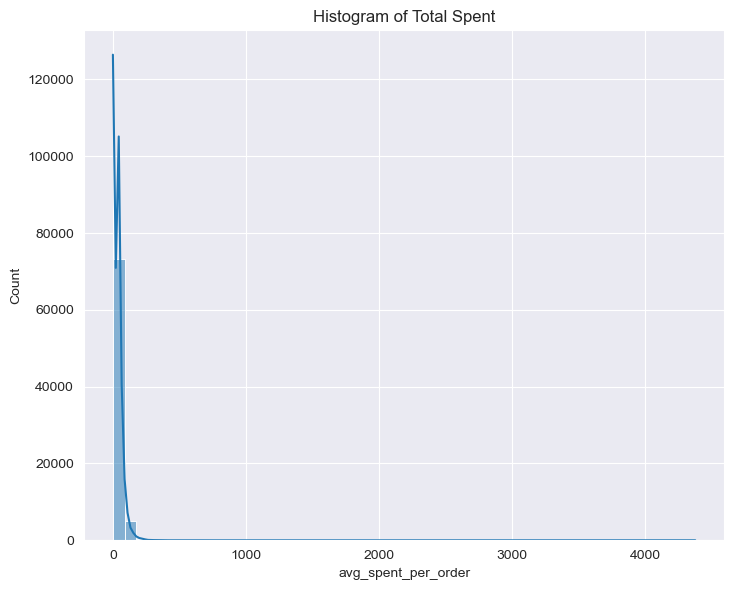

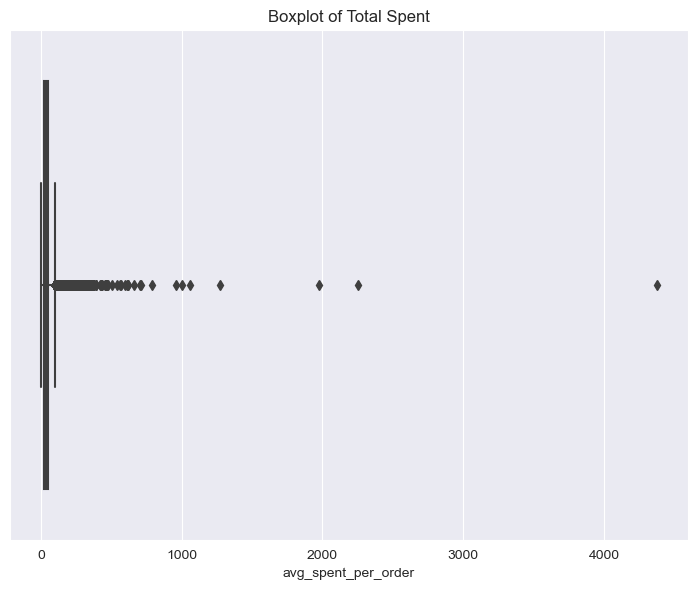

In [69]:
# plotting multiple graphs in a grid
# hist
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(df_customers_cleaned['avg_spent_per_order'], bins=50, kde=True)
plt.title('Histogram of Total Spent')

plt.tight_layout()
plt.show()

# boxplots
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x=df_customers_cleaned['avg_spent_per_order'])
plt.title('Boxplot of Total Spent')

plt.tight_layout()
plt.show()

In [61]:
"""# Define the condition for identifying inaccurate rows
condition2 = (df_customers_cleaned['total_spent'] > 5000.00) | (df_customers_cleaned['total_orders'] > 100) | (df_customers_cleaned['avg_spent_per_order'] > 1000)

# Extract the customer_id of rows that meet the condition
scatred_customer_ids = df_customers.loc[condition, 'customer_id']
# Drop the scatred rows from the customers DataFrame
df_customers_filtered = df_customers_cleaned[~condition2]"""

In [70]:
# List of numerical columns
numerical_columns = df_customers_cleaned.select_dtypes(include='number').columns

# Create histograms for each numerical column
fig = go.Figure()
for column in numerical_columns:
    fig.add_trace(go.Histogram(x=df_customers_cleaned[column], name=column))

# Update layout
fig.update_layout(
    title='Distribution of Numerical Columns',
    xaxis_title='Values',
    yaxis_title='Count',
    barmode='overlay',
    bargap=0.1
)

fig.show()

In [71]:
# Create box plots for each numerical column
fig = go.Figure()
for column in numerical_columns:
    fig.add_trace(go.Box(y=df_customers_cleaned[column], name=column))

# Update layout
fig.update_layout(
    title='Box Plot of Numerical Columns',
    yaxis_title='Values'
)

fig.show()

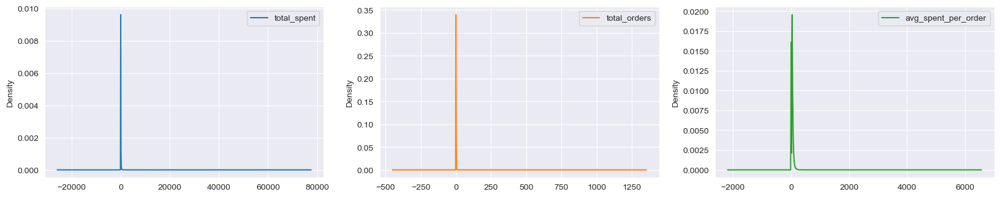

In [72]:
df_customers_cleaned[numerical_columns].plot(kind='density', subplots=True, layout=(2,3), sharex=False, figsize= (20,8))
plt.show()

## Orders visualizing

In [73]:
df_orders.describe(include='all')

,Name,Created at,Lineitem quantity,Lineitem name,Lineitem price,Lineitem sku,Lineitem requires shipping,Lineitem taxable,Lineitem fulfillment status,Lineitem discount,customer_id
count,122563,122563,122563.000000,122563,122563.000000,122563,122563,122563,122563,122563.000000,122563
unique,75119,75089,NaN,1148,NaN,388,1,2,3,NaN,53918
top,#127870,2021-05-07 11:24:34 +0200,NaN,Lot de 2 masques de protection en tissu réutil...,NaN,LOT200001A106/000-BLC-TU,True,True,fulfilled,NaN,'4491371249860
freq,28,28,NaN,1544,NaN,4158,122563,119749,121457,NaN,1978
mean,NaN,NaN,1.299209,NaN,24.945199,NaN,NaN,NaN,NaN,0.073291,NaN
std,NaN,NaN,2.580186,NaN,12.362275,NaN,NaN,NaN,NaN,1.112257,NaN
min,NaN,NaN,1.000000,NaN,0.000000,NaN,NaN,NaN,NaN,0.000000,NaN
25%,NaN,NaN,1.000000,NaN,16.580000,NaN,NaN,NaN,NaN,0.000000,NaN
50%,NaN,NaN,1.000000,NaN,23.940000,NaN,NaN,NaN,NaN,0.000000,NaN
75%,NaN,NaN,1.000000,NaN,33.250000,NaN,NaN,NaN,NaN,0.000000,NaN


In [74]:
initial_order_count = df_orders.shape[0]
print(f"Initial number of rows in df_orders: {initial_order_count}")

# Filter df_orders to keep only rows where customer_id exists in df_filtered_customers
df_orders_filtered = df_orders[df_orders['customer_id'].isin(df_customers_cleaned['customer_id'])]

final_order_count = df_orders_filtered.shape[0]
print(f"Number of rows in df_orders after filtering: {final_order_count}")
print(f"Number of rows removed: {initial_order_count - final_order_count}")

Initial number of rows in df_orders: 122563
Number of rows in df_orders after filtering: 120422
Number of rows removed: 2141


## # Plot the heatmap of the correlation matrix

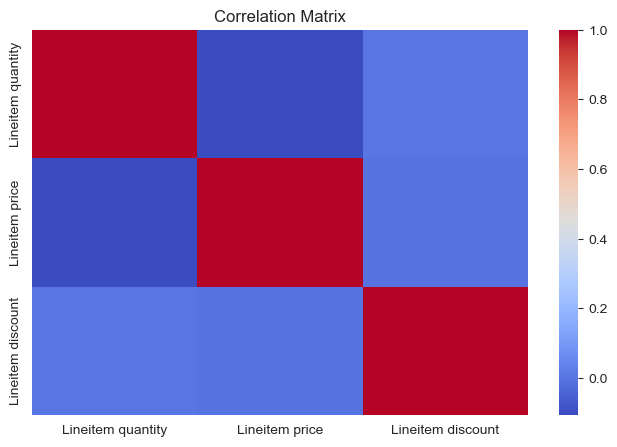

Highly correlated column pairs (correlation > 0.34898): Empty DataFrame
Columns: [Column1, Column2, Correlation]
Index: []


In [75]:
numeric_columns = df_orders_filtered.select_dtypes(include=['number'])

corr_matrix = numeric_columns.corr()

# Plot
plt.figure(figsize=(8, 5))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Identify highly correlated columns (correlation > 0.9)
corr_pairs = corr_matrix.abs().stack().reset_index()
corr_pairs.columns = ['Column1', 'Column2', 'Correlation']
high_corr_pairs = corr_pairs[(corr_pairs['Correlation'] > 0.34898) & (corr_pairs['Column1'] != corr_pairs['Column2'])]
print("Highly correlated column pairs (correlation > 0.34898):", high_corr_pairs)

# saving new datasets

In [76]:
df_orders_filtered.to_csv('data/cleaned_data/orders.csv', index=False)
df_customers_cleaned.to_csv('data/cleaned_data/customers.csv', index=False)

In [77]:
# load all clean data
df_customers = pd.read_csv('data/cleaned_data/customers.csv')
df_products = pd.read_csv('data/cleaned_data/products.csv')
df_orders = pd.read_csv('data/cleaned_data/orders.csv')

## Visualizing df_products

In [78]:
pd.set_option('display.max_columns', None) 
df_products.describe(include='all')

,Handle,Title,Body (HTML),Product Category,Type,Tags,Published,Option1 Value,Option2 Value,Variant SKU,Variant Grams,Variant Inventory Qty,Variant Price,Variant Compare At Price,SEO Title,SEO Description,Google Shopping / Google Product Category,Google Shopping / Gender,Google Shopping / Age Group,Google Shopping / Custom Label 0,Cost per item,Status
count,402,134,133,86,133,133,134,402,398,402,402.000000,402.000000,402.000000,395.000000,116,130,33,119,119,102,13.000000,134
unique,134,134,133,14,23,118,2,15,15,402,NaN,NaN,NaN,NaN,113,120,10,3,3,19,NaN,2
top,culotte-amincissante-ventre-plat,Baume réparateur mains et pieds,"<h5><span style=""color: #000000;"" data-mce-sty...",Vêtements et accessoires > Vêtements > Sous-vê...,Legging,"Accessoires, Actif, Masque, Modèles, Nouveauté...",True,Noir,L/XL,NEG0015,NaN,NaN,NaN,NaN,Ceinture amincissante ventre plat femme Lytess...,Innovation Lytess : Découvrez notre gamme d'or...,Apparel & Accessories > Clothing > Underwear &...,female,adultes,legging,NaN,active
freq,15,1,1,30,18,5,125,266,118,1,NaN,NaN,NaN,NaN,2,4,11,90,62,16,NaN,125
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,114.940299,36.681592,32.039080,46.604253,NaN,NaN,NaN,NaN,NaN,NaN,8.060769,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53.704060,43.442548,10.213784,13.289629,NaN,NaN,NaN,NaN,NaN,NaN,2.420329,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.830000,7.900000,NaN,NaN,NaN,NaN,NaN,NaN,6.750000,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85.000000,16.000000,27.930000,39.900000,NaN,NaN,NaN,NaN,NaN,NaN,6.920000,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,108.000000,25.000000,31.430000,44.900000,NaN,NaN,NaN,NaN,NaN,NaN,7.210000,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,137.750000,42.000000,38.430000,54.900000,NaN,NaN,NaN,NaN,NaN,NaN,7.210000,NaN


## dropping unnecessary columns

In [79]:
df_products.drop(['Cost per item', 'Variant Compare At Price', 'Status'], axis=1, inplace=True)

## Renaming columns for clarity

In [80]:
df_products.rename(columns={
    'Handle': 'handle',
    'Title': 'title',
    'Body (HTML)': 'body_html',
    'Product Category': 'product_category',
    'Type': 'type',
    'Tags': 'tags',
    'Published': 'published',
    'Option1 Value': 'option1_value',
    'Option2 Value': 'option2_value',
    'Variant SKU': 'variant_sku',
    'Variant Grams': 'variant_grams',
    'Variant Inventory Qty': 'variant_inventory_qty',
    'Variant Price': 'variant_price',
    'SEO Title': 'seo_title',
    'SEO Description': 'seo_description',
    'Google Shopping / Google Product Category': 'google_shopping_product_category',
    'Google Shopping / Gender': 'google_shopping_gender',
    'Google Shopping / Age Group': 'google_shopping_age_group',
    'Google Shopping / Custom Label 0': 'google_shopping_custom_label_0'
}, inplace=True)

In [81]:
# Renaming columns for clarity
df_customers.rename(columns={
    'Customer ID': 'customer_id',
    'Accepts Email Marketing': 'accepts_email_marketing',
    'Default Address Company': 'default_address_company',
    'Default Address City': 'default_address_city',
    'Default Address Country Code': 'default_address_country_code',
    'Default Address Zip': 'default_address_zip',
    'Accepts SMS Marketing': 'accepts_sms_marketing',
    'Total Spent': 'total_spent',
    'Total Orders': 'total_orders',
    'Tax Exempt': 'tax_exempt'
}, inplace=True)

## Numerical features in df_products plotting

c:\Users\moham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



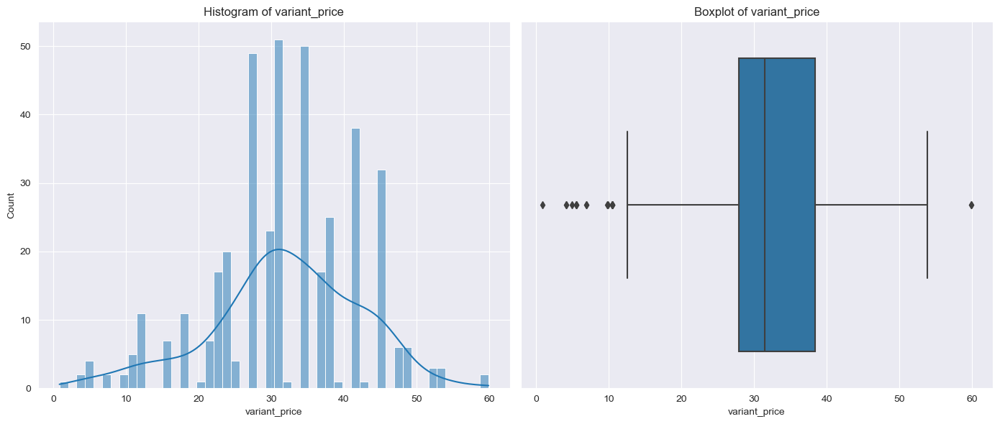

c:\Users\moham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



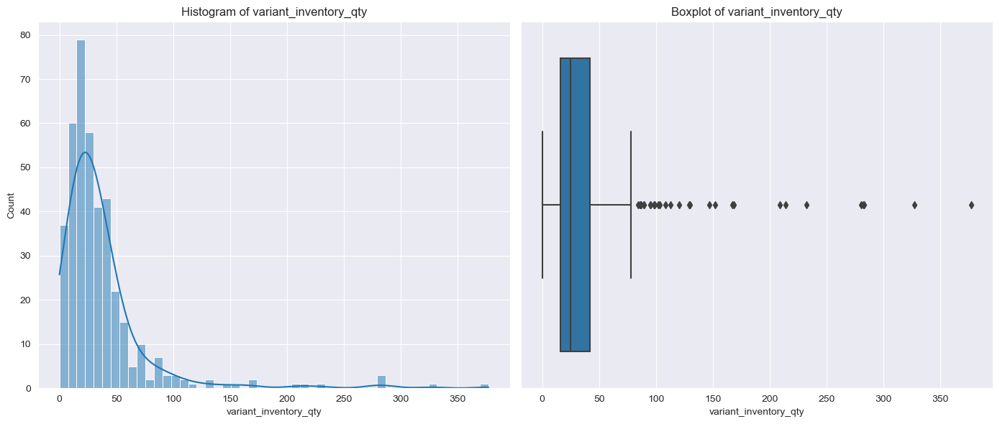

c:\Users\moham\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



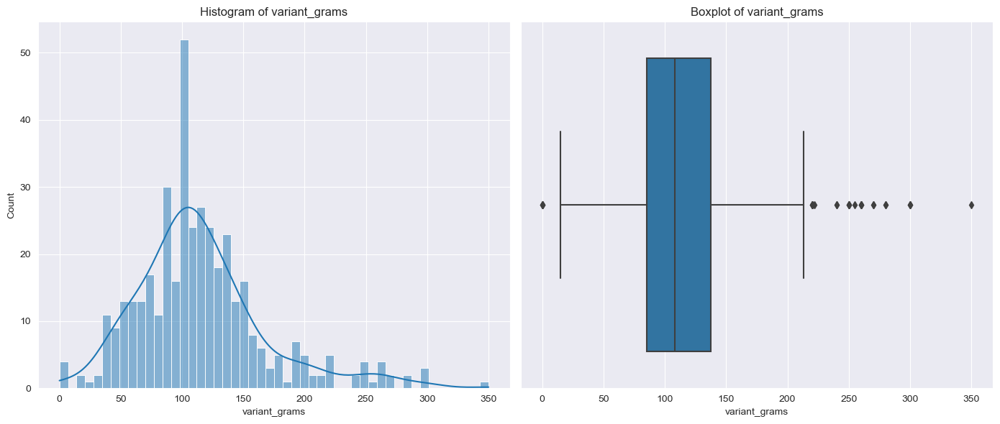

In [82]:
# Plotting multiple graphs (histogram and boxplot) in a grid for variant_price
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(df_products['variant_price'].dropna(), bins=50, kde=True)
plt.title('Histogram of variant_price')

plt.subplot(1, 2, 2)
sns.boxplot(x=df_products['variant_price'].dropna())
plt.title('Boxplot of variant_price')

plt.tight_layout()
plt.show()

# Plotting multiple graphs (histogram and boxplot) in a grid for variant_inventory_qty
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(df_products['variant_inventory_qty'].dropna(), bins=50, kde=True)
plt.title('Histogram of variant_inventory_qty')

plt.subplot(1, 2, 2)
sns.boxplot(x=df_products['variant_inventory_qty'].dropna())
plt.title('Boxplot of variant_inventory_qty')

plt.tight_layout()
plt.show()

# Plotting multiple graphs (histogram and boxplot) in a grid for variant_grams
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(df_products['variant_grams'].dropna(), bins=50, kde=True)
plt.title('Histogram of variant_grams')

plt.subplot(1, 2, 2)
sns.boxplot(x=df_products['variant_grams'].dropna())
plt.title('Boxplot of variant_grams')

plt.tight_layout()
plt.show()

In [83]:
numerical_columns = df_products.select_dtypes(include='number').columns

# Create histograms for each numerical column
fig = go.Figure()
for column in numerical_columns:
    fig.add_trace(go.Histogram(x=df_products[column], name=column))

# Update layout
fig.update_layout(
    title='Distribution of Numerical Columns',
    xaxis_title='Values',
    yaxis_title='Count',
    barmode='overlay',
    bargap=0.1
)

fig.show()

In [84]:
# Create box plots for each numerical column
fig = go.Figure()
for column in numerical_columns:
    fig.add_trace(go.Box(y=df_products[column], name=column))

# Update layout
fig.update_layout(
    title='Box Plot of Numerical Columns',
    yaxis_title='Values'
)

fig.show()

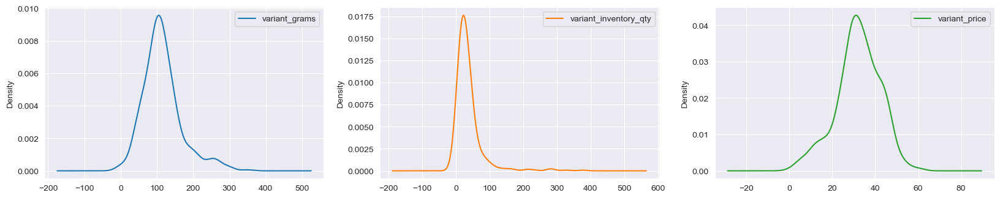

In [85]:
df_products[numerical_columns].plot(kind='density', subplots=True, layout=(2,3), sharex=False, figsize= (20,8))
plt.show()

## Correlation

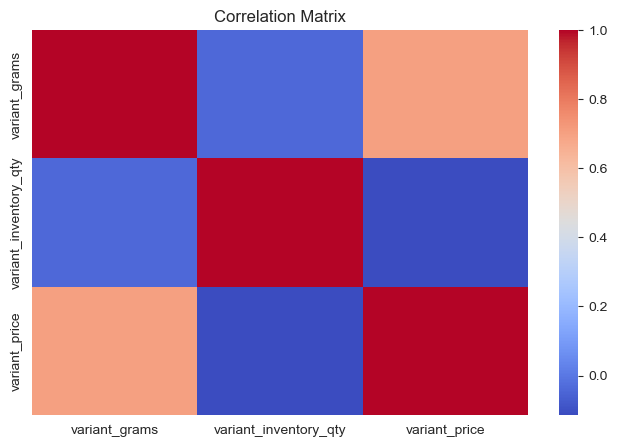

Highly correlated column pairs (correlation > 0.8): Empty DataFrame
Columns: [Column1, Column2, Correlation]
Index: []


In [86]:
numerical_columns = df_products.select_dtypes(include=['number'])

corr_matrix = numerical_columns.corr()

# plot heatmap
plt.figure(figsize=(8, 5))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Identify highly correlated columns (correlation > 0.8)
corr_pairs = corr_matrix.abs().stack().reset_index()
corr_pairs.columns = ['Column1', 'Column2', 'Correlation']
high_corr_pairs = corr_pairs[(corr_pairs['Correlation'] > 0.8) & (corr_pairs['Column1'] != corr_pairs['Column2'])]
print("Highly correlated column pairs (correlation > 0.8):", high_corr_pairs)

## df_products categorical features

## handle

In [87]:
column_product_handle = 'handle'
value_counts_product_handle = df_products[column_product_handle].value_counts(dropna=False)

print(value_counts_product_handle)

handle
culotte-amincissante-ventre-plat                             15
culotte-ceinture-gainante-et-minceur                         11
shorty-gainant-et-minceur                                    10
maillot-de-bain-sculptant-minceur                             8
brassiere-raffermissante                                      8
                                                             ..
pochette-masque                                               1
lot-de-2-masques-de-protection-reutilisables-enfants-uns1     1
baume-calmant                                                 1
pantacourt-minceur-express                                    1
panty-stop-cellulite                                          1
Name: count, Length: 134, dtype: int64


## title

In [88]:
column_product_title = 'title'
value_counts_product_title = df_products[column_product_title].value_counts(dropna=False)

print(value_counts_product_title)

title
NaN                                                       268
Baume réparateur mains et pieds                             1
Culotte amincissante Ventre Plat                            1
Epaulière de maintien apaisante                             1
Ensemble Caraco raffermissant et Panty Minceur de Nuit      1
                                                         ... 
Coffret de Noël                                             1
Gants de protection Stop Covid réutilisables                1
Legging Yogafit minceur                                     1
Brassière Fermeté anti-âge                                  1
Panty stop cellulite                                        1
Name: count, Length: 135, dtype: int64


## body_html

In [89]:
column_product_body_html = 'body_html'
value_counts_product_body_html = df_products[column_product_body_html].value_counts(dropna=False)

print(value_counts_product_body_html)

body_html
NaN                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

## product_category

In [90]:
column_product_category = 'product_category'
value_counts_product_category = df_products[column_product_category].value_counts(dropna=False)

print(value_counts_product_category)

product_category
NaN                                                                                                      316
Vêtements et accessoires > Vêtements > Sous-vêtements et chaussettes > Sous-vêtements gainants            30
Vêtements et accessoires                                                                                  14
Vêtements et accessoires > Vêtements > Sous-vêtements et chaussettes > Sous-vêtements                      8
Santé et beauté > Hygiène personnelle > Cosmétiques > Soin de la peau                                      7
Santé et beauté > Santé                                                                                    6
Vêtements et accessoires > Vêtements > Sous-vêtements et chaussettes > Lingerie                            5
Arts et loisirs > Loisirs et arts créatifs > Articles de collection > Articles de sport de collection      4
Vêtements et accessoires > Vêtements > Sous-vêtements et chaussettes > Soutiens-gorges                     3
Vê

## type

In [91]:
column_product_type = 'type'
value_counts_product_type = df_products[column_product_type].value_counts(dropna=False)

print(value_counts_product_type)

type
NaN                                           269
Legging                                        18
Top & tee shirt                                14
Panty                                          13
Masque                                         11
Brassière                                      10
Corsaire                                       10
Pantacourt                                      8
body                                            8
Culotte                                         8
Orthèse                                         6
Gaine                                           5
maillot de bain                                 4
Boxer                                           3
ACCESSOIRES                                     2
Cuissard                                        2
Collant                                         2
Bien-être                                       2
Accessoire sport hydratant et récupération      2
Gants                                        

## tags

In [92]:
column_product_tags = 'tags'
value_counts_product_tags = df_products[column_product_tags].value_counts(dropna=False)

print(value_counts_product_tags)

tags
NaN                                                                                                                                                                                                                               269
Accessoires, Actif, Masque, Modèles, Nouveautés, Promo                                                                                                                                                                              5
Accessoires, Actif, Masque, Modèles, Promo                                                                                                                                                                                          3
11 à 20 jours, Actif, Blanc, Boxer, Hanches, L, M, Minceur, Modèles, Niveau 2 : galbant, Noir, Promo, Taille, Ventre, XL                                                                                                            3
6 à 10 jours, Actif, Homme, HOMME SECONDE PEAU, Minceur, Modèles, Niveau 1 

## published

In [93]:
column_product_published = 'published'
value_counts_product_published = df_products[column_product_published].value_counts(dropna=False)

print(value_counts_product_published)

published
NaN      268
True     125
False      9
Name: count, dtype: int64


## option1_value

In [94]:
column_product_option1_value = 'option1_value'
value_counts_product_option1_value = df_products[column_product_option1_value].value_counts(dropna=False)

print(value_counts_product_option1_value)

option1_value
Noir             266
Blanc             46
Chair             32
Noir-Blanc        12
Rose               8
Ivoire             8
Corail             8
Bleu               6
Default Title      4
Bleu Marine        2
Vert Kaki          2
Gris&Noir          2
Gris               2
Bordeaux           2
Noir-Bleu          2
Name: count, dtype: int64


## option2_value

In [95]:
column_product_option2_value = 'option2_value'
value_counts_product_option2_value = df_products[column_product_option2_value].value_counts(dropna=False)

print(value_counts_product_option2_value)

option2_value
L/XL        118
S/M         114
XXL          39
TU           18
M            18
L            18
XL           18
3XL          15
S             8
1             8
2             8
3             8
NaN           4
4XL           4
S/M (XS)      2
4             2
Name: count, dtype: int64


## seo_title

In [96]:
column_product_seo_title = 'seo_title'
value_counts_product_seo_title = df_products[column_product_seo_title].value_counts(dropna=False)

print(value_counts_product_seo_title)

seo_title
NaN                                                                          286
Ceinture amincissante ventre plat femme Lytess : Perdez un tour de taille      2
Caraco raffermissant Lytess : Perdez un tour de taille                         2
Cuissard sport homme Lytess : Booster de performance                           2
Culotte sculptante Lytess : Perdez une taille                                  1
                                                                            ... 
Legging taille haute gainant Lytess : Efficacité prouvée                       1
Panty taille haute gainant Lytess : Efficacité prouvée                         1
Tee-shirt col V amincissant homme Lytess : Perdez une taille                   1
Box beauté anti-cellulite idéale pour le printemps                             1
Panty anti cellulite Lytess : objectif zéro cellulite                          1
Name: count, Length: 114, dtype: int64


## seo_description

In [97]:
column_product_seo_description = 'seo_description'
value_counts_product_seo_description = df_products[column_product_seo_description].value_counts(dropna=False)

print(value_counts_product_seo_description)

seo_description
NaN                                                                                                                                                                                                         272
Innovation Lytess : Découvrez notre gamme d'orthèses souples ✓Soulage rapidement ✓Apaise en continu✓ Huiles essentielles de Romarin ✓Arnica                                                                   4
Caraco raffermissant → Mincissez sans effort ! Livraison 48h, offerte dès 40€. Lytess, votre secret minceur                                                                                                   2
Maillot de bain gainant ventre plat : Mincissez sans effort ! Livraison 48h, offerte dès 40€. Lytess, votre allié minceur                                                                                     2
Cuissard sport confort et thermorégulant homme → Une seconde peau innovante pour une action décontractante pendant et après l'effort ! Livraison 48h, of

In [91]:
"""# Drop multiple columns
df_products.drop(['seo_description'], axis=1, inplace=True)"""

## google_shopping_product_category

In [98]:
column_product_google_shopping_product_category = 'google_shopping_product_category'
value_counts_product_google_shopping_product_category = df_products[column_product_google_shopping_product_category].value_counts(dropna=False)

print(value_counts_product_google_shopping_product_category)

google_shopping_product_category
NaN                                                                                  369
Apparel & Accessories > Clothing > Underwear & Socks > Shapewear                      11
Health & Beauty > Personal Care > Cosmetics > Skin Care > Skin Care Masks & Peels      9
Apparel & Accessories > Clothing > Underwear & Socks > Underwear                       3
Apparel & Accessories > Clothing > Sleepwear & Loungewear                              2
Apparel & Accessories > Clothing > Underwear & Socks                                   2
Apparel & Accessories > Clothing > Activewear                                          2
Apparel & Accessories > Clothing > Underwear & Socks > Underwear Slips                 1
Apparel & Accessories > Clothing Accessories > Gloves & Mittens                        1
Apparel & Accessories > Clothing > Swimwear                                            1
Business & Industrial > Medical > Medical Equipment > Gait Belts             

## google_shopping_gender

In [99]:
column_product_google_shopping_gender = 'google_shopping_gender'
value_counts_product_google_shopping_gender = df_products[column_product_google_shopping_gender].value_counts(dropna=False)

print(value_counts_product_google_shopping_gender)

google_shopping_gender
NaN       283
female     90
male       15
unisex     14
Name: count, dtype: int64


## google_shopping_age_group

In [100]:
column_product_google_shopping_age_group = 'google_shopping_age_group'
value_counts_product_google_shopping_age_group = df_products[column_product_google_shopping_age_group].value_counts(dropna=False)

print(value_counts_product_google_shopping_age_group)

google_shopping_age_group
NaN        283
adultes     62
adult       56
enfants      1
Name: count, dtype: int64


## google_shopping_custom_label_0

In [101]:
column_product_google_shopping_custom_label_0 = 'google_shopping_custom_label_0'
value_counts_product_google_shopping_custom_label_0 = df_products[column_product_google_shopping_custom_label_0].value_counts(dropna=False)

print(value_counts_product_google_shopping_custom_label_0)

google_shopping_custom_label_0
NaN                300
legging             16
panty               12
brassière           11
t-shirt             11
body                 8
culotte              8
corsaire             6
ceinture             4
maillot de bain      4
pantacourt           3
masque               3
caraco               3
boxer                3
débardeur            3
manchon              2
collant              2
shorty               1
string               1
gants                1
Name: count, dtype: int64


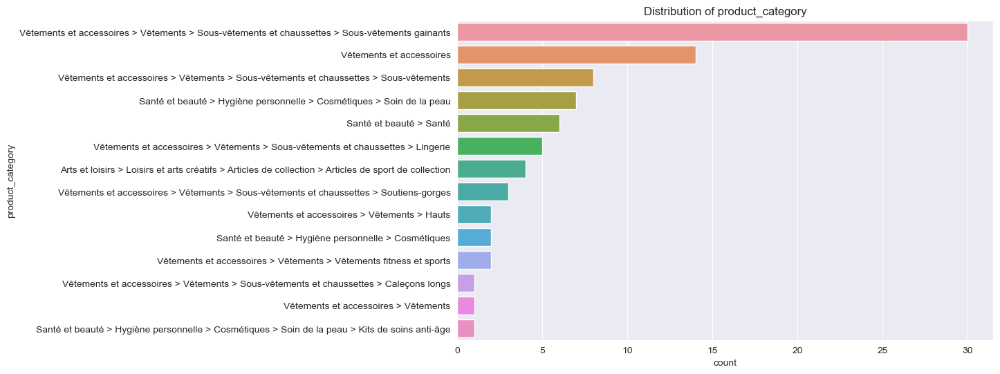

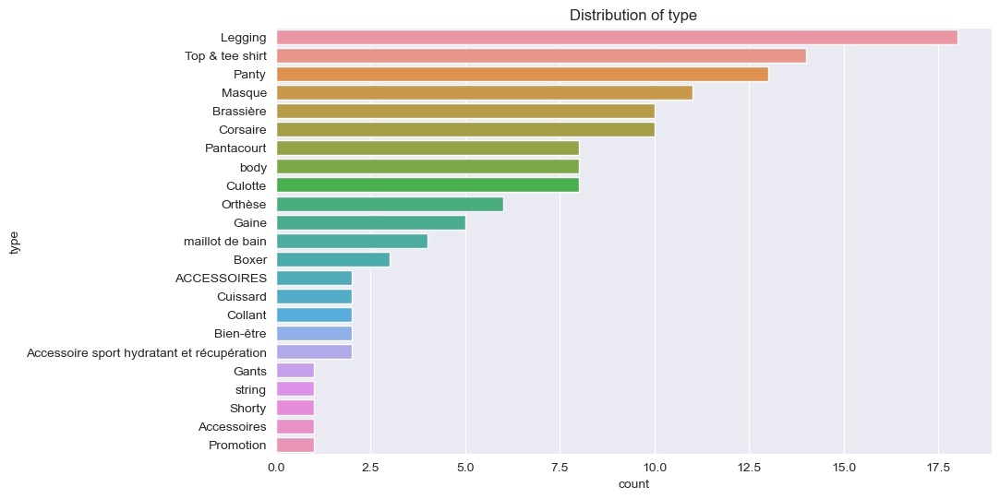

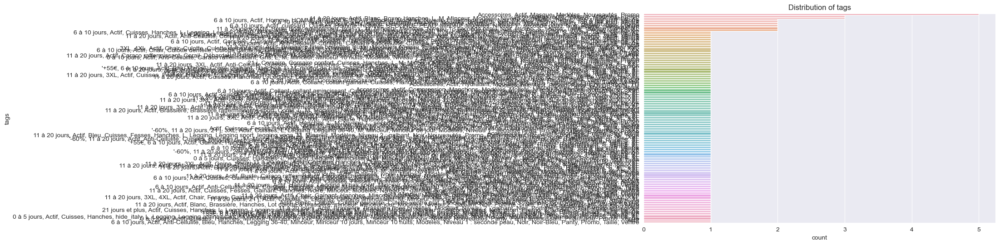

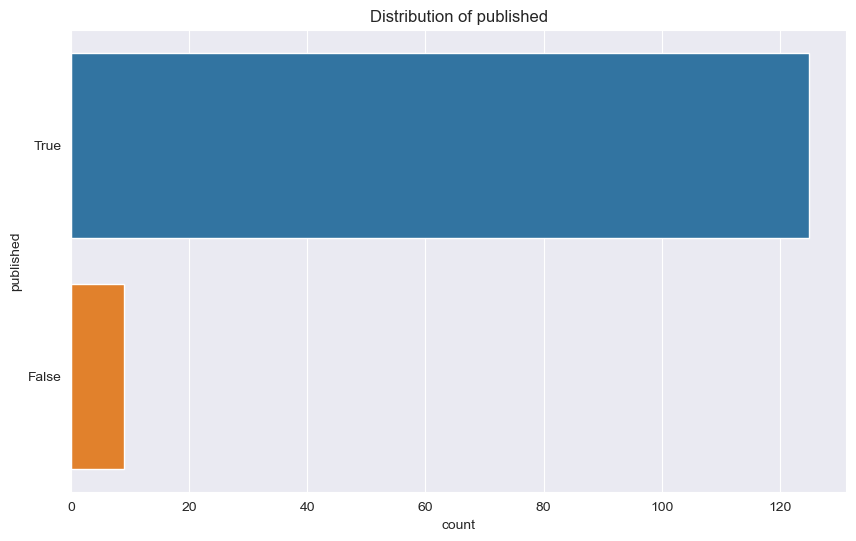

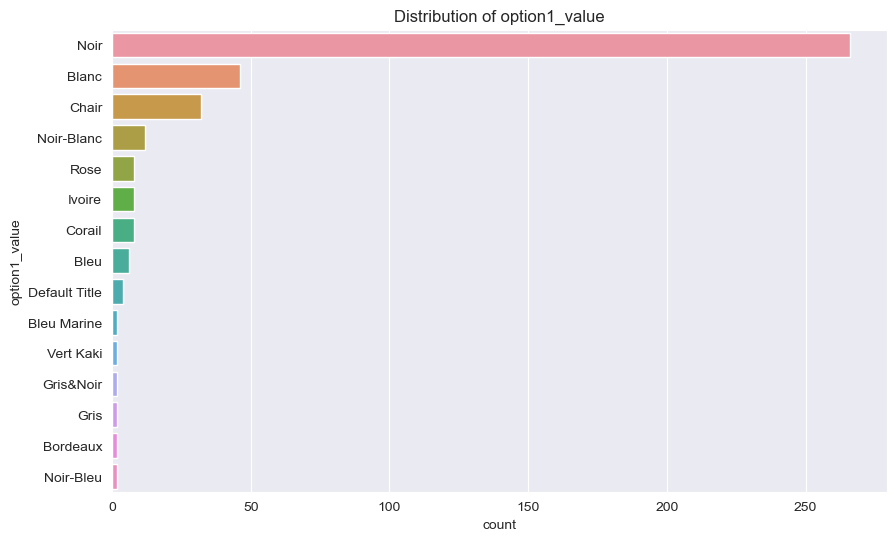

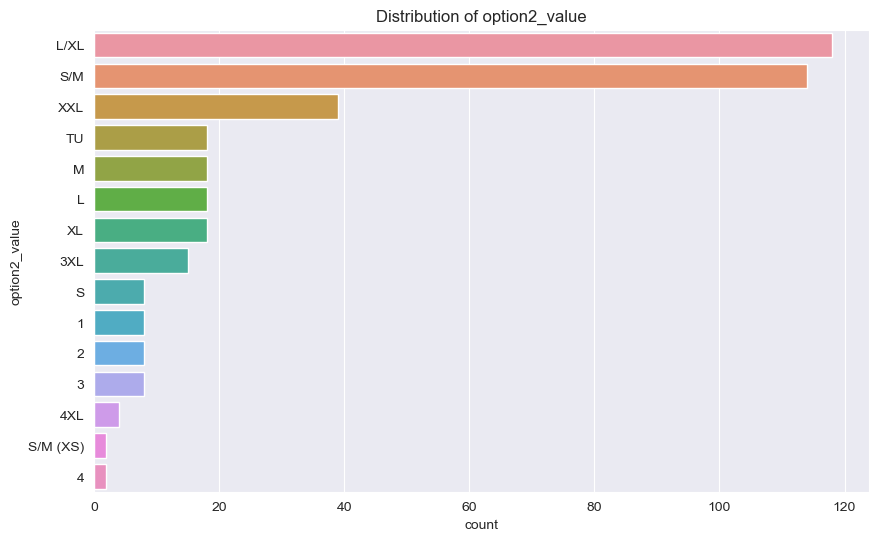

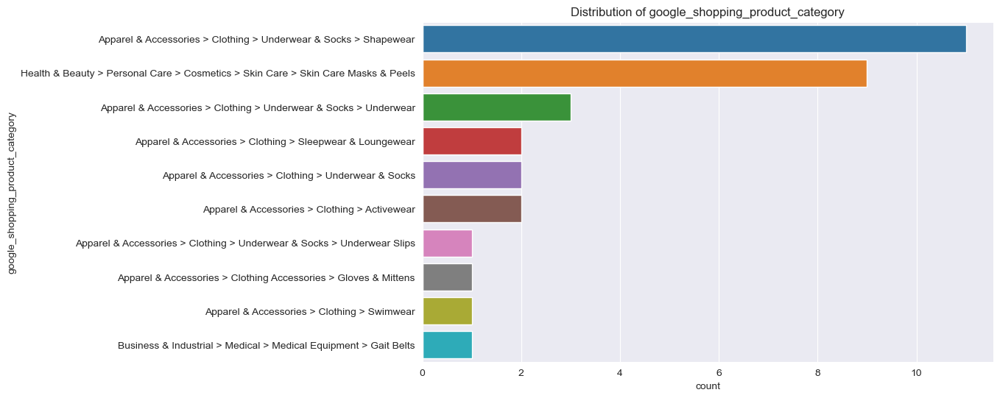

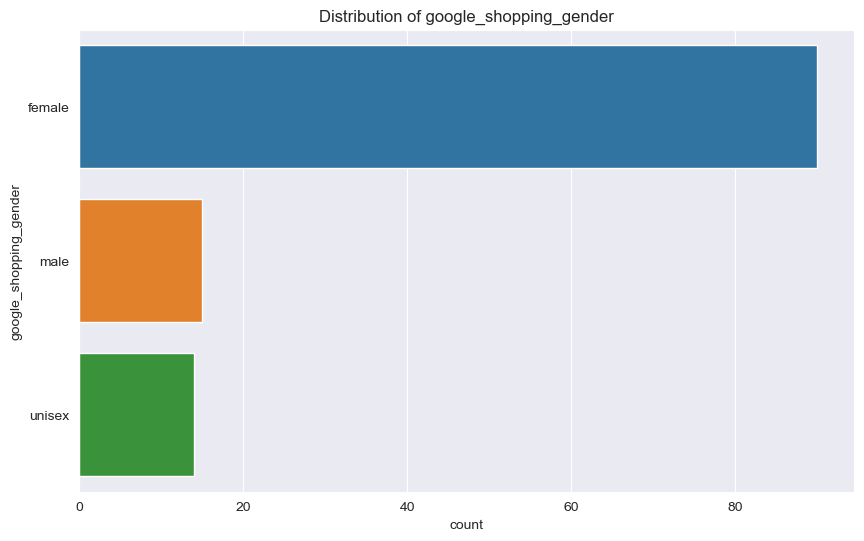

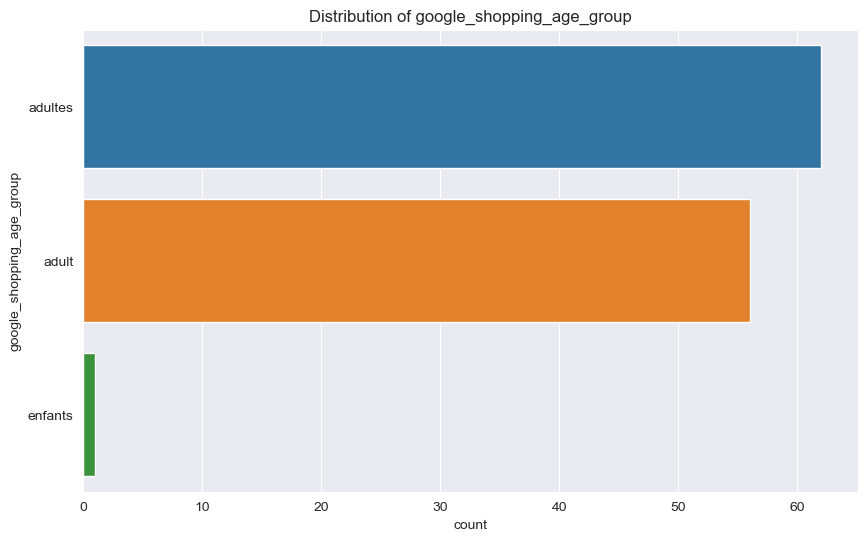

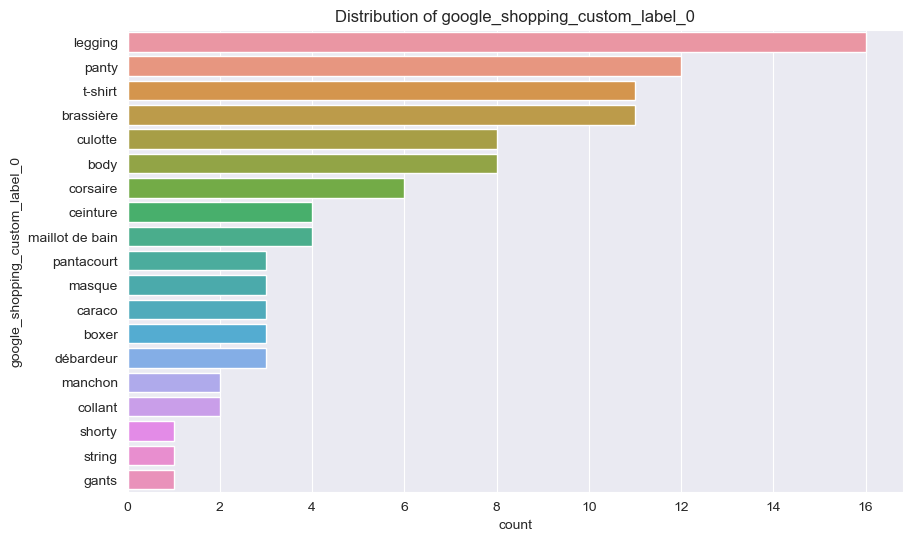

In [102]:
# Plot histograms for categorical features except seo_description
categorical_features = ['product_category', 'type', 'tags', 'published', 'option1_value', 'option2_value', 'google_shopping_product_category', 'google_shopping_gender', 'google_shopping_age_group', 'google_shopping_custom_label_0']
for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    sns.countplot(y=feature, data=df_products, order=df_products[feature].value_counts().index)
    plt.title(f'Distribution of {feature}')
    plt.show()

In [103]:
# Save the products and customers DataFrame to a CSV file
df_customers.to_csv('data/cleaned_data/customers.csv', index=False)
df_products.to_csv('data/cleaned_data/products.csv', index=False)